<a href="https://colab.research.google.com/github/WillSAdkins/MSc_project_EEG/blob/main/Analysis_7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

All code in this notebook is original and written by the researcher (Will Adkins), unless stated otherwise. With the exception of some of the code being taken from the online MNE tutorials (https://mne.tools/stable/auto_tutorials/index.html). This notebook is designed to run in Google Colab and is available on Github (https://github.com/WillSAdkins/MSc_project_EEG) for ease of use.

# Setup

In [ ]:
from zipfile import ZipFile
import pandas as pd
from sklearn.model_selection import train_test_split
import string
import numpy as np
#!pip install tensorflow
#import tensorflow as tf
from sklearn.preprocessing import Normalizer
from sklearn.decomposition import PCA
# !pip install keras
from keras.models import Sequential,load_model
from keras.layers import Dense, Dropout, Conv2D, Flatten
from sklearn.metrics import accuracy_score, mean_squared_error

import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from sklearn.preprocessing import OneHotEncoder
!pip install tqdm
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
import seaborn as sns
import glob
#import cv2
import gc
!pip install mne
import mne
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
import time
import pickle
from mne.preprocessing import create_ecg_epochs
from scipy.interpolate import Rbf
!pip install pyriemann
import pyriemann
import csv

def save_model_json(model, filename):
    # serialize model to JSON
    model_json = model.to_json()
    with open(f"{filename}.json", "w") as json_file:
        json_file.write(model_json)
    # serialize weights to HDF5
    model.save_weights(f"{filename}.h5")
    print(f"Saved {filename} to disk")



def load_model_json(filename):
    # load json and create model
    json_file = open(f'{filename}.json', 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)
    # load weights into new model
    loaded_model.load_weights(f"{filename}.h5")
    print(f"Loaded {filename} from disk")
    return loaded_model

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 7.5 MB 7.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 365 kB 14.6 MB/s 
  Created wheel for pyriemann: filename=pyriemann-0.3-py2.py3-none-any.whl size=78033 sha256=8c4fdb904abd3d126ac936bc10cd12a97a72bd861a0e5947227bdbb77e6e5b4d
  Stored in directory: /root/.cache/pip/wheels/0b/1b/bf/a537f9e17e6c3490004ede419c72f863af1d0d765d25e532ef
Successfully built pyriemann


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Handle data

In [ ]:
from warnings import resetwarnings
# Load the data in...
dir_path = "/content/drive/MyDrive/Bath/Dissertation/Analysis/Participants/"
participant = '7'
with ZipFile(dir_path + participant + '/' + 'recordings.zip', 'r') as zip_file:
    print(zip_file)
    print(zip_file.printdir())
    zip_file.extractall()

speaking1 = pd.read_csv('Labelled/speaking1_labelled.csv')
speaking2 = pd.read_csv('Labelled/speaking2_labelled.csv')
speaking3 = pd.read_csv('Labelled/speaking3_labelled.csv')
speaking4 = pd.read_csv('Labelled/speaking4_labelled.csv')
speaking5 = pd.read_csv('Labelled/speaking5_labelled.csv')
speaking6 = pd.read_csv('Labelled/speaking6_labelled.csv')
speaking7 = pd.read_csv('Labelled/speaking7_labelled.csv')
speaking8 = pd.read_csv('Labelled/speaking8_labelled.csv')
speaking9 = pd.read_csv('Labelled/speaking9_labelled.csv')
speaking10 = pd.read_csv('Labelled/speaking10_labelled.csv')
stimuli = pd.read_csv('Labelled/stimuli_labelled.csv')

<zipfile.ZipFile filename='/content/drive/MyDrive/Bath/Dissertation/Analysis/Participants/7/recordings.zip' mode='r'>
File Name                                             Modified             Size
Labelled/speaking1_labelled.csv                2022-08-16 21:34:46     16863467
Labelled/speaking10_labelled.csv               2022-08-16 21:34:48     16913609
Labelled/speaking2_labelled.csv                2022-08-16 21:34:48     16865113
Labelled/speaking3_labelled.csv                2022-08-16 21:34:46     16860841
Labelled/speaking4_labelled.csv                2022-08-16 21:34:48     16860055
Labelled/speaking5_labelled.csv                2022-08-16 21:34:46     16863163
Labelled/speaking6_labelled.csv                2022-08-16 21:34:48     16855165
Labelled/speaking7_labelled.csv                2022-08-16 21:34:48     16862695
Labelled/speaking8_labelled.csv                2022-08-16 21:34:48     16865032
Labelled/speaking9_labelled.csv                2022-08-16 21:34:46     16859314
La

In [ ]:
n_epochs = stimuli['Epoch'].iloc[-1] + 1 # Set the number of epochs as a variable for reference, and in the case we need to use it

In [ ]:
# Create a speaking dataset that is the concatenation of each of the 10 speaking datasets for each repeat, whilst preserving order to the epochs...
speaking = pd.concat([speaking1, speaking2, speaking3, speaking4, speaking5, speaking6, speaking7, speaking8, speaking9, speaking10], axis = 0).sort_values('Time:256Hz')
speaking.iloc[:1024]

,Time:256Hz,Epoch,F3,FC5,AF3,F7,T7,P7,O1,O2,...,T8,F8,AF4,FC6,F4,Channel 15,Channel 16,Label,Mode of Stimulus,Stage
0,23.000000,0,4252.179688,4313.077148,4240.256348,4304.871582,4240.769043,4237.307617,4234.871582,4233.974121,...,4345.384766,4231.666504,4243.077148,4234.102539,4204.102539,4250.384766,4312.692383,Lamp,audio,speaking1
1,23.003906,0,4233.717773,4249.358887,4348.846191,4232.563965,4235.384766,4233.461426,4203.077148,4249.487305,...,4232.179688,4292.179688,4235.128418,4236.666504,4231.538574,4233.205078,4244.358887,Lamp,audio,speaking1
2,23.007812,0,4249.871582,4310.256348,4228.717773,4275.512695,4232.692383,4234.615234,4229.871582,4231.794922,...,4343.461426,4228.717773,4227.436035,4234.615234,4202.179688,4251.282227,4309.615234,Lamp,audio,speaking1
3,23.011719,0,4229.487305,4230.897461,4344.487305,4226.922852,4226.153809,4234.871582,4201.025879,4252.692383,...,4223.077148,4268.205078,4232.948730,4230.897461,4226.410156,4226.794922,4229.102539,Lamp,audio,speaking1
4,23.015625,0,4253.077148,4307.692383,4220.128418,4277.948730,4233.846191,4229.871582,4224.871582,4225.256348,...,4357.307617,4225.384766,4222.563965,4234.230957,4201.282227,4252.179688,4307.436035,Lamp,audio,speaking1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
507,26.980469,0,4249.487305,4319.743652,4156.538574,4248.333496,4246.922852,4249.102539,4219.871582,4233.333496,...,4238.077148,4195.384766,4371.538574,4242.307617,4253.205078,4245.256348,4318.846191,Lamp,audio,speaking2
508,26.984375,0,4249.487305,4319.743652,4156.538574,4248.333496,4246.922852,4249.102539,4219.871582,4233.333496,...,4238.077148,4195.384766,4371.538574,4242.307617,4253.205078,4245.256348,4318.846191,Lamp,audio,speaking2
509,26.988281,0,4249.487305,4319.743652,4156.538574,4248.333496,4246.922852,4249.102539,4219.871582,4233.333496,...,4238.077148,4195.384766,4371.538574,4242.307617,4253.205078,4245.256348,4318.846191,Lamp,audio,speaking2
510,26.992188,0,4249.487305,4319.743652,4156.538574,4248.333496,4246.922852,4249.102539,4219.871582,4233.333496,...,4238.077148,4195.384766,4371.538574,4242.307617,4253.205078,4245.256348,4318.846191,Lamp,audio,speaking2


In [ ]:
# it can be seen that one epoch of speaking data contains 512 recordings (256 recordings per second for 2 seconds) of 14 channels, 
# with the two reference channels included in the dataset aswell.
speaking[speaking['Epoch'] == 0]

,Time:256Hz,Epoch,F3,FC5,AF3,F7,T7,P7,O1,O2,...,T8,F8,AF4,FC6,F4,Channel 15,Channel 16,Label,Mode of Stimulus,Stage
0,23.000000,0,4252.179688,4313.077148,4240.256348,4304.871582,4240.769043,4237.307617,4234.871582,4233.974121,...,4345.384766,4231.666504,4243.077148,4234.102539,4204.102539,4250.384766,4312.692383,Lamp,audio,speaking1
1,23.003906,0,4233.717773,4249.358887,4348.846191,4232.563965,4235.384766,4233.461426,4203.077148,4249.487305,...,4232.179688,4292.179688,4235.128418,4236.666504,4231.538574,4233.205078,4244.358887,Lamp,audio,speaking1
2,23.007812,0,4249.871582,4310.256348,4228.717773,4275.512695,4232.692383,4234.615234,4229.871582,4231.794922,...,4343.461426,4228.717773,4227.436035,4234.615234,4202.179688,4251.282227,4309.615234,Lamp,audio,speaking1
3,23.011719,0,4229.487305,4230.897461,4344.487305,4226.922852,4226.153809,4234.871582,4201.025879,4252.692383,...,4223.077148,4268.205078,4232.948730,4230.897461,4226.410156,4226.794922,4229.102539,Lamp,audio,speaking1
4,23.015625,0,4253.077148,4307.692383,4220.128418,4277.948730,4233.846191,4229.871582,4224.871582,4225.256348,...,4357.307617,4225.384766,4222.563965,4234.230957,4201.282227,4252.179688,4307.436035,Lamp,audio,speaking1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
507,42.980469,0,4246.794922,4261.025879,4246.282227,4133.974121,4201.538574,4237.820312,4245.000000,4250.384766,...,4581.153809,4239.871582,4259.871582,4233.974121,4230.641113,4247.436035,4264.487305,Lamp,audio,speaking10
508,42.984375,0,4245.128418,4246.922852,4571.922852,4236.666504,4262.307617,4232.179688,4231.922852,4247.179688,...,4244.487305,4141.794922,4186.794922,4234.871582,4242.179688,4238.333496,4242.692383,Lamp,audio,speaking10
509,42.988281,0,4246.282227,4266.538574,4239.743652,4140.256348,4182.563965,4231.666504,4238.205078,4232.820312,...,4548.846191,4226.922852,4251.538574,4231.538574,4230.769043,4245.128418,4264.102539,Lamp,audio,speaking10
510,42.992188,0,4230.512695,4234.743652,4539.743652,4225.384766,4245.512695,4233.333496,4226.282227,4244.615234,...,4233.974121,4137.307617,4193.333496,4228.846191,4230.897461,4230.641113,4232.692383,Lamp,audio,speaking10


In [ ]:
# Speaking dataset contains 10 2 second windows per epoch for 130 epochs, with 512 time points with 14 channels per time point plus other info. 
# Leading to 665600 time recordings/samples/exanplars with 14 features
# (For those datasets that are complete !)
speaking

,Time:256Hz,Epoch,F3,FC5,AF3,F7,T7,P7,O1,O2,...,T8,F8,AF4,FC6,F4,Channel 15,Channel 16,Label,Mode of Stimulus,Stage
0,23.000000,0,4252.179688,4313.077148,4240.256348,4304.871582,4240.769043,4237.307617,4234.871582,4233.974121,...,4345.384766,4231.666504,4243.077148,4234.102539,4204.102539,4250.384766,4312.692383,Lamp,audio,speaking1
1,23.003906,0,4233.717773,4249.358887,4348.846191,4232.563965,4235.384766,4233.461426,4203.077148,4249.487305,...,4232.179688,4292.179688,4235.128418,4236.666504,4231.538574,4233.205078,4244.358887,Lamp,audio,speaking1
2,23.007812,0,4249.871582,4310.256348,4228.717773,4275.512695,4232.692383,4234.615234,4229.871582,4231.794922,...,4343.461426,4228.717773,4227.436035,4234.615234,4202.179688,4251.282227,4309.615234,Lamp,audio,speaking1
3,23.011719,0,4229.487305,4230.897461,4344.487305,4226.922852,4226.153809,4234.871582,4201.025879,4252.692383,...,4223.077148,4268.205078,4232.948730,4230.897461,4226.410156,4226.794922,4229.102539,Lamp,audio,speaking1
4,23.015625,0,4253.077148,4307.692383,4220.128418,4277.948730,4233.846191,4229.871582,4224.871582,4225.256348,...,4357.307617,4225.384766,4222.563965,4234.230957,4201.282227,4252.179688,4307.436035,Lamp,audio,speaking1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58875,3948.980469,114,4245.256348,4237.436035,4247.436035,4297.436035,4228.589844,4251.794922,4245.641113,4243.846191,...,4264.871582,4287.563965,4215.000000,4248.717773,4244.230957,4245.128418,4235.512695,Lamp,text,speaking10
58876,3948.984375,114,4244.615234,4267.436035,4264.871582,4287.563965,4211.666504,4248.846191,4243.589844,4245.384766,...,4247.820312,4285.512695,4232.307617,4251.794922,4247.563965,4244.230957,4267.436035,Lamp,text,speaking10
58877,3948.988281,114,4244.615234,4267.436035,4264.871582,4287.563965,4211.666504,4248.846191,4243.589844,4245.384766,...,4247.820312,4285.512695,4232.307617,4251.794922,4247.563965,4244.230957,4267.436035,Lamp,text,speaking10
58878,3948.992188,114,4244.615234,4267.436035,4264.871582,4287.563965,4211.666504,4248.846191,4243.589844,4245.384766,...,4247.820312,4285.512695,4232.307617,4251.794922,4247.563965,4244.230957,4267.436035,Lamp,text,speaking10


In [ ]:
#Create some dataframes that we can later reference, in analysis...
def Handle(dataframe):
    
    features = dataframe.drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Label', 'Mode of Stimulus']).to_numpy().reshape(dataframe.shape[0] // (512), 512 * 14)
    targets = dataframe['Label'].to_numpy().reshape(dataframe.shape[0] // (512), 512)[:, 0]
    modes_of_stimuli = dataframe['Mode of Stimulus'].to_numpy().reshape(dataframe.shape[0] // (512), 512)[:, 0]
    return features, targets, modes_of_stimuli
features, targets, modes_of_stimuli = Handle(speaking)
stimuli_features, stimuli_targets, modes_of_stimuli_stimstage = Handle(stimuli)

In [ ]:
#Create some data frames that can also be used later as a reference...
# audio_ind = np.array(modes_of_stimuli) == 'audio'
# audio_feat = features[audio_ind]
# audio_targ = targets[audio_ind]

# text_ind = np.array(modes_of_stimuli) == 'text'
# text_feat = features[text_ind]
# text_targ = targets[text_ind]

# image_ind = np.array(modes_of_stimuli) == 'image'
# image_feat = features[image_ind]
# image_targ = targets[image_ind]

# stimuli_audio_ind = np.array(modes_of_stimuli_stimstage) == 'audio'
# stimuli_audio_feat = stimuli_features[stimuli_audio_ind]
# stimuli_audio_targ = stimuli_targets[stimuli_audio_ind]

# stimuli_text_ind = np.array(modes_of_stimuli_stimstage) == 'text'
# stimuli_text_feat = stimuli_features[stimuli_text_ind]
# stimuli_text_targ = stimuli_targets[stimuli_text_ind]

# stimuli_image_ind = np.array(modes_of_stimuli_stimstage) == 'image'
# stimuli_image_feat = stimuli_features[stimuli_image_ind]
# stimuli_image_targ = stimuli_targets[stimuli_image_ind]

# Interpolation of frozen values

This is the code for investigating a solution to the problem of frozen/dead data, that in the end was not pursued.

In [ ]:
# Generate list of the index of the rows of data that are repeated...
tester_array = speaking[['F3', 'FC5', 'AF3', 'F7', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'F8', 'AF4', 'FC6', 'F4']]
tester_array = tester_array.to_numpy()
repeats_ind = []
non_repeats_ind = [0]
for i in range(1, speaking.shape[0]):
  if (tester_array[i-1, :] == tester_array[i, :]).all():
    repeats_ind.append(i)
  else:
    non_repeats_ind.append(i)

repeats_ind = np.array(repeats_ind, dtype = 'int')
non_repeats_ind = np.array(non_repeats_ind, dtype = 'int')
print(repeats_ind.shape, non_repeats_ind.shape, (repeats_ind.shape[0] + non_repeats_ind.shape[0] == speaking.shape[0]))
repeats_ind, non_repeats_ind

(196467,) (392333,) True


(array([     6,      7,      8, ..., 588797, 588798, 588799]),
 array([     0,      1,      2, ..., 588794, 588795, 588796]))

In [ ]:
speaking.iloc[repeats_ind]

,Time:256Hz,Epoch,F3,FC5,AF3,F7,T7,P7,O1,O2,...,T8,F8,AF4,FC6,F4,Channel 15,Channel 16,Label,Mode of Stimulus,Stage
6,23.023438,0,4225.256348,4233.077148,4361.282227,4224.358887,4220.641113,4235.000000,4205.128418,4251.025879,...,4218.205078,4287.436035,4231.282227,4230.769043,4225.897461,4226.794922,4233.717773,Lamp,audio,speaking1
7,23.027344,0,4225.256348,4233.077148,4361.282227,4224.358887,4220.641113,4235.000000,4205.128418,4251.025879,...,4218.205078,4287.436035,4231.282227,4230.769043,4225.897461,4226.794922,4233.717773,Lamp,audio,speaking1
8,23.031250,0,4225.256348,4233.077148,4361.282227,4224.358887,4220.641113,4235.000000,4205.128418,4251.025879,...,4218.205078,4287.436035,4231.282227,4230.769043,4225.897461,4226.794922,4233.717773,Lamp,audio,speaking1
9,23.035156,0,4225.256348,4233.077148,4361.282227,4224.358887,4220.641113,4235.000000,4205.128418,4251.025879,...,4218.205078,4287.436035,4231.282227,4230.769043,4225.897461,4226.794922,4233.717773,Lamp,audio,speaking1
10,23.039062,0,4225.256348,4233.077148,4361.282227,4224.358887,4220.641113,4235.000000,4205.128418,4251.025879,...,4218.205078,4287.436035,4231.282227,4230.769043,4225.897461,4226.794922,4233.717773,Lamp,audio,speaking1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58843,3948.855469,114,4256.922852,4248.974121,4252.692383,4260.512695,4195.769043,4247.436035,4235.897461,4251.922852,...,4248.461426,4289.615234,4216.410156,4244.871582,4248.974121,4260.512695,4248.205078,Lamp,text,speaking10
58844,3948.859375,114,4256.922852,4248.974121,4252.692383,4260.512695,4195.769043,4247.436035,4235.897461,4251.922852,...,4248.461426,4289.615234,4216.410156,4244.871582,4248.974121,4260.512695,4248.205078,Lamp,text,speaking10
58877,3948.988281,114,4244.615234,4267.436035,4264.871582,4287.563965,4211.666504,4248.846191,4243.589844,4245.384766,...,4247.820312,4285.512695,4232.307617,4251.794922,4247.563965,4244.230957,4267.436035,Lamp,text,speaking10
58878,3948.992188,114,4244.615234,4267.436035,4264.871582,4287.563965,4211.666504,4248.846191,4243.589844,4245.384766,...,4247.820312,4285.512695,4232.307617,4251.794922,4247.563965,4244.230957,4267.436035,Lamp,text,speaking10


In [ ]:
# Create a time index column in the dataframe so that time index could be used as an inpput in a model for predicting values to replace the repeats.
epoch_relative_indicies = pd.DataFrame((list(np.arange(1, 513)) * n_epochs * 10)[:speaking.shape[0]], columns = ['Time Index'])
print(len(epoch_relative_indicies), n_epochs)
pd.concat([speaking, epoch_relative_indicies])
speaking['Time Index'] = epoch_relative_indicies['Time Index']
non_repeats_data = speaking.iloc[non_repeats_ind].drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Mode of Stimulus', 'Label'])
repeats_data = speaking.iloc[repeats_ind].drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Mode of Stimulus', 'Label'])
#non_repeats_data

588800 115


In [ ]:
# Create an array of time indexes, and then corresponding 14 values at these time points...
repeats_data_values = repeats_data.drop(columns = ['Time Index']).to_numpy()
repeats_data_times = repeats_data['Time Index'].to_numpy()
non_repeats_data_values = non_repeats_data.drop(columns = ['Time Index']).to_numpy()
non_repeats_data_times = non_repeats_data['Time Index'].to_numpy()
repeats_data_values.shape, repeats_data_times.shape, non_repeats_data_values.shape, non_repeats_data_times.shape

((196467, 14), (196467,), (392333, 14), (392333,))

In [ ]:
non_repeats_data_values

array([[4252.1796875 , 4313.07714844, 4240.25634766, ..., 4243.07714844,
        4234.10253906, 4204.10253906],
       [4233.71777344, 4249.35888672, 4348.84619141, ..., 4235.12841797,
        4236.66650391, 4231.53857422],
       [4249.87158203, 4310.25634766, 4228.71777344, ..., 4227.43603516,
        4234.61523438, 4202.1796875 ],
       ...,
       [4238.71777344, 4262.30761719, 4265.12841797, ..., 4223.20507812,
        4252.56396484, 4245.64111328],
       [4245.25634766, 4237.43603516, 4247.43603516, ..., 4215.        ,
        4248.71777344, 4244.23095703],
       [4244.61523438, 4267.43603516, 4264.87158203, ..., 4232.30761719,
        4251.79492188, 4247.56396484]])

In [ ]:
# Application of an RBF interpolator...


# rng = np.random.default_rng()
# x, y, z,   d= rng.random((4, 50))
# print(x, '\n\n', d)
# rbfi = Rbf(x, d)  # radial basis function interpolator instance
# xi = np.linspace(0, 1, 20)
# di = rbfi(xi)   # interpolated values
# di.shape

# rbf_interpolator = Rbf(non_repeats_data_times[:10000], non_repeats_data_values[:10000], mode = 'N-D', function = 'gaussian')
# rbf_interpolator(repeats_data_times[:1000])


# MNE work (Preprocessing) montage

<DigMontage | 0 extras (headshape), 0 HPIs, 3 fiducials, 94 channels>
4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.


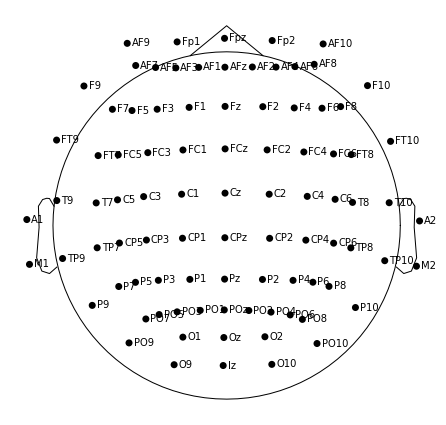

4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.


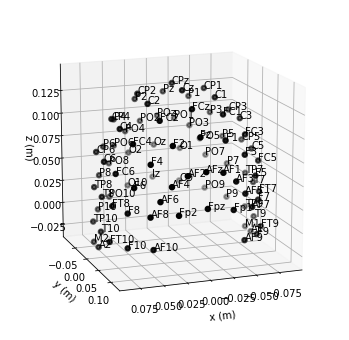

In [ ]:
# Import the standard 10-20 montage for use in the mne data set. Code taken from online MNE tutorial
s1020 = mne.channels.make_standard_montage('standard_1020')
print(s1020)

s1020.plot()  # 2D
fig = s1020.plot(kind='3d', show=False)  # 3D
fig = fig.gca().view_init(azim=70, elev=15)  # set view angle for tutorial

{'F3': array([-0.04908182,  0.06114545,  0.04584545]), 'F4': array([0.04908182, 0.06114545, 0.04584545]), 'O1': array([-0.02809091, -0.08646364,  0.        ]), 'O2': array([ 0.02809091, -0.08646364,  0.        ]), 'F7': array([-0.07354545,  0.05343636,  0.        ]), 'F8': array([0.07354545, 0.05343636, 0.        ]), 'T7': array([-0.09090909,  0.        ,  0.        ]), 'T8': array([0.09090909, 0.        , 0.        ]), 'P7': array([-7.35454545e-02, -5.34363636e-02, -9.09090909e-06]), 'P8': array([ 7.35454545e-02, -5.34363636e-02, -9.09090909e-06]), 'FC5': array([-0.07917273,  0.03066364,  0.03226364]), 'FC6': array([0.07917273, 0.03066364, 0.03226364]), 'AF3': array([-0.03636364,  0.08181818,  0.03909091]), 'AF4': array([0.03636364, 0.08181818, 0.03909091])}


<ipython-input-17-75ac62dacbc6>:11: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  montage.plot()


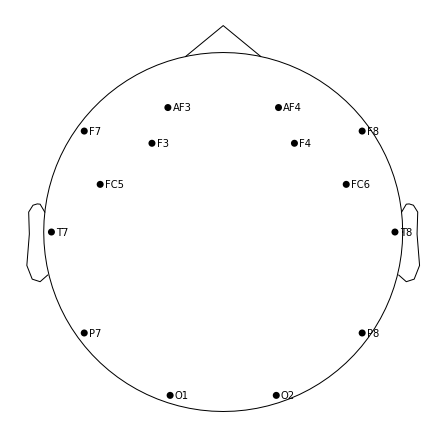

<ipython-input-17-75ac62dacbc6>:12: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  fig = montage.plot(kind='3d', show=False)  # 3D


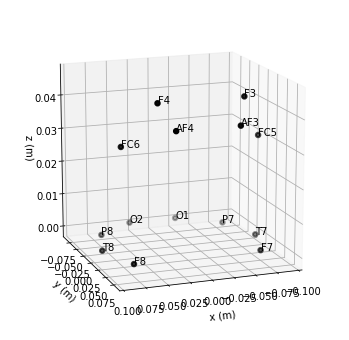

In [ ]:
# Load in custom montage for visualisation purposes, not for use in datasets. Code taken from online MNE tutorial. 
# Channels_positional_Emotiv14.txt being a custom made file, created by the researcher (Will Adkins).

df = pd.read_csv('/content/drive/MyDrive/Bath/Dissertation/Analysis/channels_positional_Emotiv14.txt')
ch_names = df.name.to_list()

pos = df[['x','y','z']].values/11 # Scale down to size
dig_ch_pos = dict(zip(ch_names,pos))
print(dig_ch_pos)
montage = mne.channels.make_dig_montage(ch_pos=dig_ch_pos)
montage.plot()
fig = montage.plot(kind='3d', show=False)  # 3D
fig = fig.gca().view_init(azim=70, elev=15)  # set view angle for tutorial

# MNE work stimuli data

In [ ]:
stimuli_mne = stimuli.drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Mode of Stimulus', 'Label']) # remove unwanted columns and keep channel data for loading into the mne dataset.

In [ ]:
# Load data into mne RawArray format, with montage set to standard 10-20 system...

sfreq = 256
ch_names = list(stimuli_mne.columns)
print(ch_names)
info = mne.create_info(ch_names = ch_names, sfreq = sfreq, ch_types = 'eeg')
raw_stimuli = mne.io.RawArray(stimuli_mne[ch_names].transpose()/1000000, info)
raw_stimuli.set_montage(s1020)
raw_stimuli.info
#raw_stimuli.plot()
raw_stimuli

['F3', 'FC5', 'AF3', 'F7', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'F8', 'AF4', 'FC6', 'F4']
Creating RawArray with float64 data, n_channels=14, n_times=58880
    Range : 0 ... 58879 =      0.000 ...   229.996 secs
Ready.


<RawArray | 14 x 58880 (230.0 s), ~6.3 MB, data loaded>

Using matplotlib as 2D backend.


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


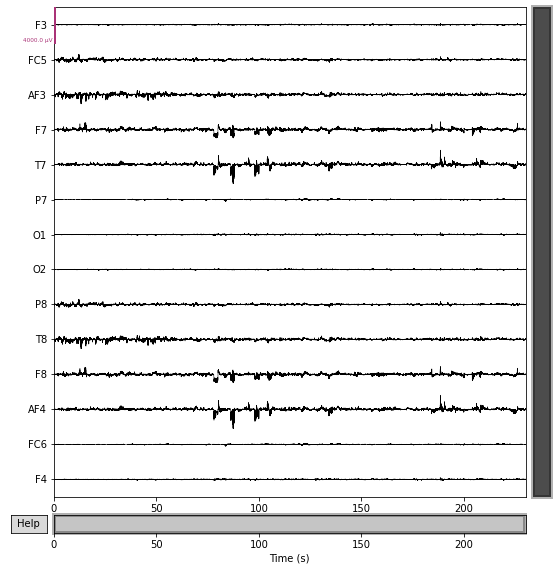

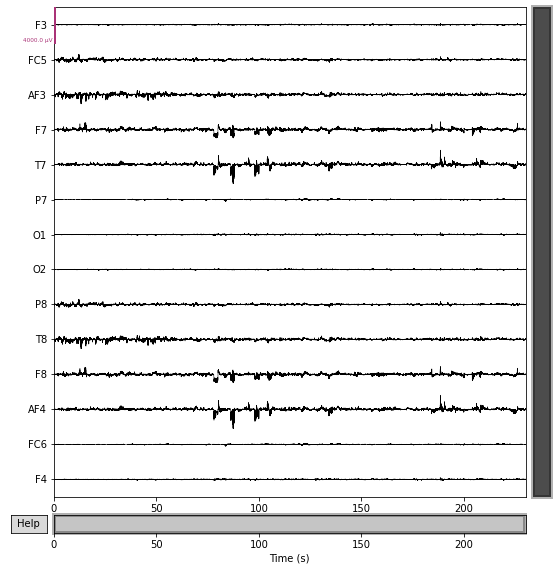

In [ ]:
raw_stimuli.plot(duration = 3000, scalings = 0.002)

In [ ]:
# Create an events array and dictionary for the loading of the data into an mne Epochs format (In the case of the stimuli data)...

events_stimuli = mne.make_fixed_length_events(raw_stimuli, start=0, stop=4504, duration=2)
events_dict = {'Visual/Ambulance' : 1,
               'Visual/Hospital' : 2,
               'Visual/Clock' : 3,
               'Visual/Lamp' : 4,
               'Audio/Ambulance' : 5,
               'Audio/Hospital' : 6,
               'Audio/Clock' : 7,
               'Audio/Lamp' : 8,
               'Text/Ambulance' : 9,
               'Text/Hospital' : 10,
               'Text/Clock' : 11,
               'Text/Lamp' : 12,
               'None' : 13}

events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'image')*(np.array(stimuli_targets) == 'Hospital')), 2] = np.array([2 for i in range(((np.array(modes_of_stimuli_stimstage) == 'image')*(np.array(stimuli_targets) == 'Hospital')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'image')*(np.array(stimuli_targets) == 'Clock')), 2] = np.array([3 for i in range(((np.array(modes_of_stimuli_stimstage) == 'image')*(np.array(stimuli_targets) == 'Clock')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'image')*(np.array(stimuli_targets) == 'Lamp')), 2] = np.array([4 for i in range(((np.array(modes_of_stimuli_stimstage) == 'image')*(np.array(stimuli_targets) == 'Lamp')).sum())])

events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Ambulance')), 2] = np.array([5 for i in range(((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Ambulance')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Hospital')), 2] = np.array([6 for i in range(((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Hospital')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Clock')), 2] = np.array([7 for i in range(((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Clock')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Lamp')), 2] = np.array([8 for i in range(((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Lamp')).sum())])

events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'text')*(np.array(stimuli_targets) == 'Ambulance')), 2] = np.array([9 for i in range(((np.array(modes_of_stimuli_stimstage) == 'text')*(np.array(stimuli_targets) == 'Ambulance')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'text')*(np.array(stimuli_targets) == 'Hospital')), 2] = np.array([10 for i in range(((np.array(modes_of_stimuli_stimstage) == 'text')*(np.array(stimuli_targets) == 'Hospital')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'text')*(np.array(stimuli_targets) == 'Clock')), 2] = np.array([11 for i in range(((np.array(modes_of_stimuli_stimstage) == 'text')*(np.array(stimuli_targets) == 'Clock')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'text')*(np.array(stimuli_targets) == 'Lamp')), 2] = np.array([12 for i in range(((np.array(modes_of_stimuli_stimstage) == 'text')*(np.array(stimuli_targets) == 'Lamp')).sum())])

events_stimuli[np.array(modes_of_stimuli_stimstage) == 'None', 2] = np.array([13 for i in range((np.array(modes_of_stimuli_stimstage) == 'None').sum())])


for i in range(1, 14):
  print(f'Number of events with code {i} = ', (events_stimuli[:, 2] == i).sum())

Number of events with code 1 =  10
Number of events with code 2 =  9
Number of events with code 3 =  9
Number of events with code 4 =  8
Number of events with code 5 =  9
Number of events with code 6 =  8
Number of events with code 7 =  10
Number of events with code 8 =  8
Number of events with code 9 =  9
Number of events with code 10 =  9
Number of events with code 11 =  8
Number of events with code 12 =  9
Number of events with code 13 =  9


Not setting metadata
115 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 115 events and 513 original time points ...
    Rejecting  epoch based on EEG : ['AF3', 'T8']
    Rejecting  epoch based on EEG : ['AF3', 'F7', 'T8', 'F8']
    Rejecting  epoch based on EEG : ['T7']
    Rejecting  epoch based on EEG : ['F7', 'T7', 'F8', 'AF4']
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['F7', 'T7', 'F8', 'AF4']
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['T7']
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['F7', 'T7', 'F8', 'AF4']
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['F7', 'T7', 'F8', 'AF4']
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['F7', 'F8']
16 bad ep

<ipython-input-22-bdd878730c89>:4: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  stimuli_epoched.plot(events = events_stimuli, n_epochs=10, scalings = 'auto')
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


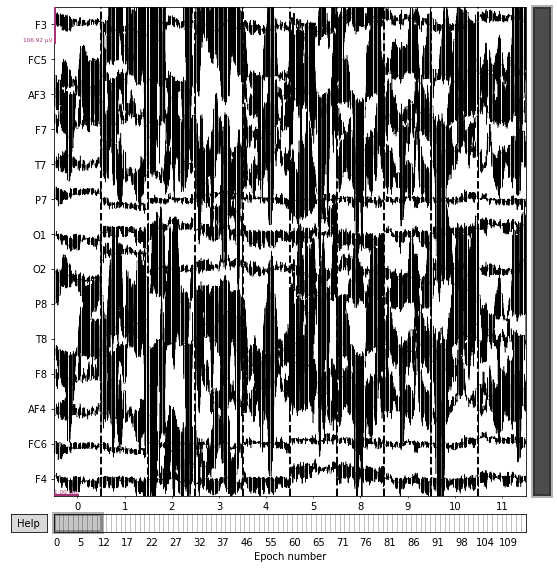

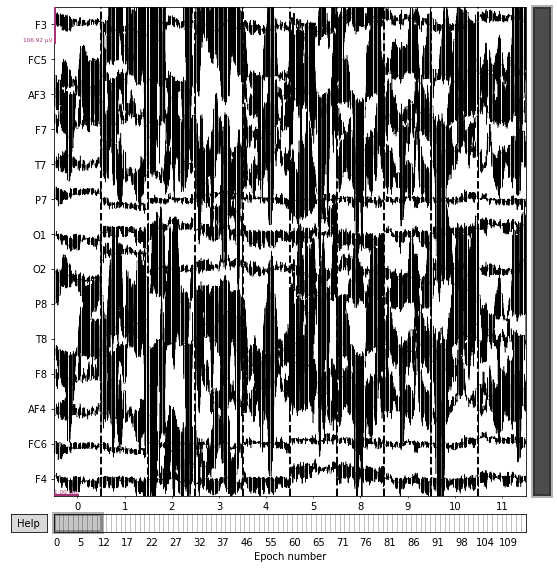

In [ ]:
#Load the stimuli data into mne Epochs format...
reject_criteria = {'eeg' : 0.001}
stimuli_epoched = mne.Epochs(raw_stimuli, tmin=0, tmax = 2, baseline=(0, 0), events = events_stimuli, event_id=events_dict, reject=reject_criteria, preload = True)
stimuli_epoched.plot(events = events_stimuli, n_epochs=10, scalings = 'auto')

In [ ]:
# stimuli_epoched.plot_psd()
# stimuli_epoched_filt = stimuli_epoched.copy().filter(l_freq = 2, h_freq = None)

# stimuli_epoched_filt.plot_psd()
# stimuli_epoched = stimuli_epoched_filt.copy()

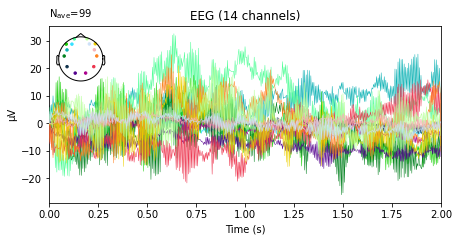

In [ ]:
# Evoked response throughout all modes of stimuli...
ER_all = stimuli_epoched.average()
fig2 = ER_all.plot(spatial_colors=True)

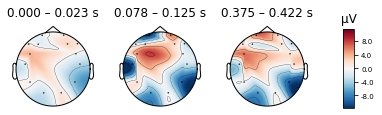

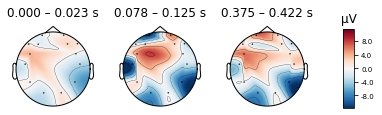

In [ ]:
ER_all.plot_topomap(times=[0, 0.1, 0.4], average=0.05)

No projector specified for this dataset. Please consider the method self.add_proj.


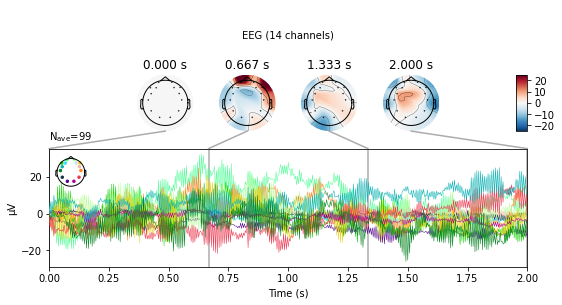

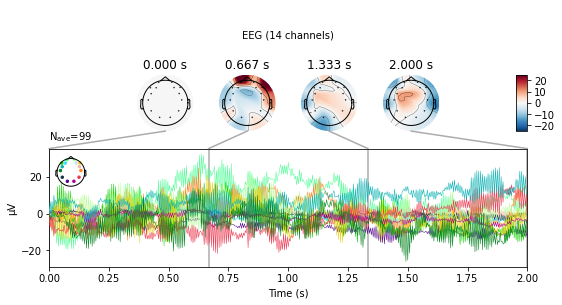

In [ ]:
ER_all.plot_joint(times='auto')

In [ ]:
# Find the average for each mode of stimuli...
# We could study the evoked response of each individual word - mode of stimulus pair, but that is beyond our scope
average_aud = stimuli_epoched['Audio'].average()
average_text = stimuli_epoched['Text'].average()
average_viz = stimuli_epoched['Visual'].average()


No projector specified for this dataset. Please consider the method self.add_proj.


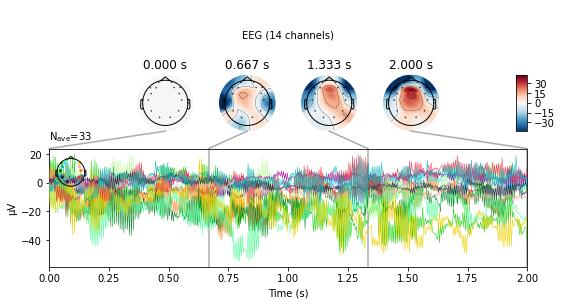

No projector specified for this dataset. Please consider the method self.add_proj.


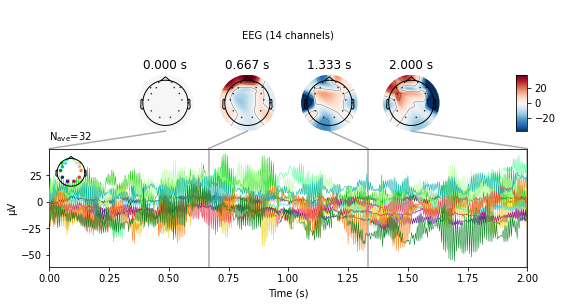

No projector specified for this dataset. Please consider the method self.add_proj.


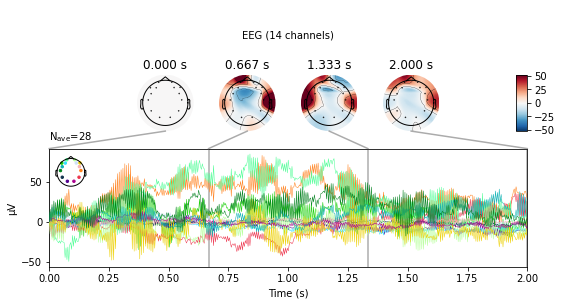

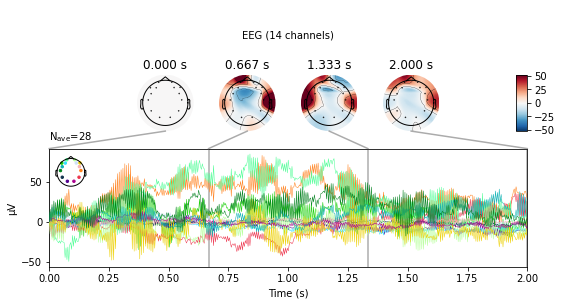

In [ ]:
# Joint plot of average repsonse for 14 channels with topography overplot...
# For Audio, Visual, and text...
average_aud.plot_joint(times='auto')
average_text.plot_joint(times='auto')
average_viz.plot_joint(times='auto')

In [ ]:
# Creation of independant lists for different brain regions of interest...
occipital = ['O1', 'O2']
temporal = ['T7', 'T8']
broca = ['F7']
ch_names


['F3',
 'FC5',
 'AF3',
 'F7',
 'T7',
 'P7',
 'O1',
 'O2',
 'P8',
 'T8',
 'F8',
 'AF4',
 'FC6',
 'F4']

More than 6 channels, truncating title ...
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


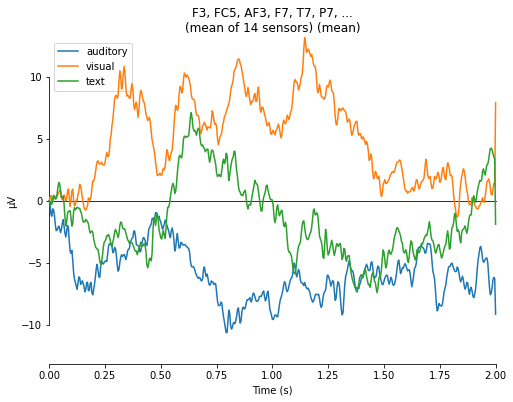

[<Figure size 576x432 with 1 Axes>]

In [ ]:
# Plot of evoked responses for all channels averaged ...
evokeds = dict(auditory=average_aud, visual=average_viz, text=average_text)
picks = [ch_names[n] for n in range(0, 14)]
mne.viz.plot_compare_evokeds(evokeds, picks, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


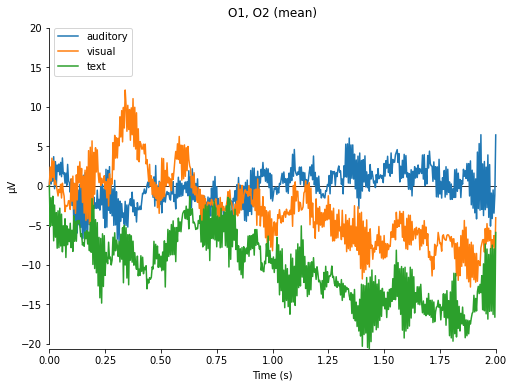

[<Figure size 576x432 with 1 Axes>]

In [ ]:
# Plot of evoked responses for Occipital regions averaged ...
mne.viz.plot_compare_evokeds(evokeds, picks = occipital, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


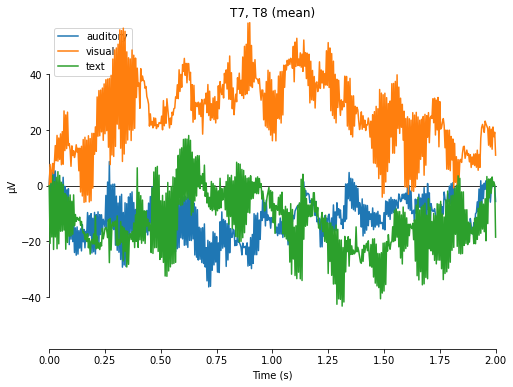

[<Figure size 576x432 with 1 Axes>]

In [ ]:
# Plot of evoked responses for regions averaged...
mne.viz.plot_compare_evokeds(evokeds, picks = temporal, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


<ipython-input-33-2a2acca60a80>:2: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')


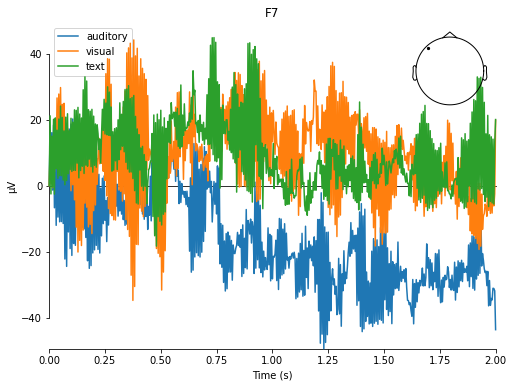

[<Figure size 576x432 with 2 Axes>]

In [ ]:
# Plot of evoked responses for brocas area averaged ...
mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')

# MNE work speaking data

In [ ]:
speaking_mne = speaking.drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Mode of Stimulus', 'Label', 'Time Index'])  # remove unwanted columns and keep channel data for loading into the mne dataset.

In [ ]:
# Load data into mne RawArray format, with montage set to standard 10-20 system...

sfreq = 256
ch_names = list(speaking_mne.columns)
print(ch_names)
info = mne.create_info(ch_names = ch_names, sfreq = sfreq, ch_types = 'eeg')
raw_speaking = mne.io.RawArray(speaking_mne[ch_names].transpose()/1000000, info)
raw_speaking.set_montage(s1020)
raw_speaking.info
raw_speaking

['F3', 'FC5', 'AF3', 'F7', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'F8', 'AF4', 'FC6', 'F4']
Creating RawArray with float64 data, n_channels=14, n_times=588800
    Range : 0 ... 588799 =      0.000 ...  2299.996 secs
Ready.


<RawArray | 14 x 588800 (2300.0 s), ~62.9 MB, data loaded>

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


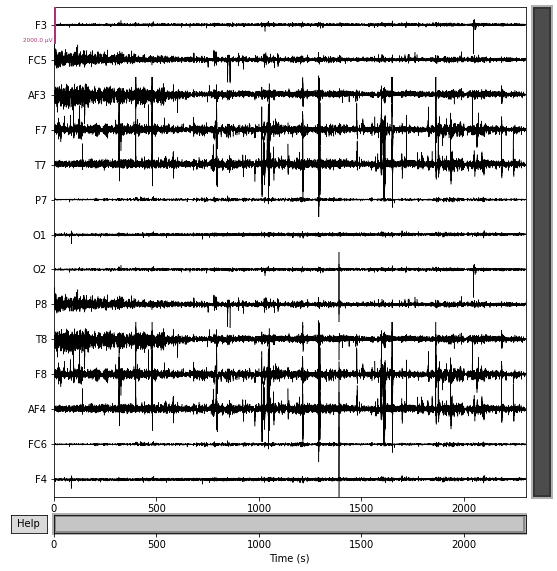

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


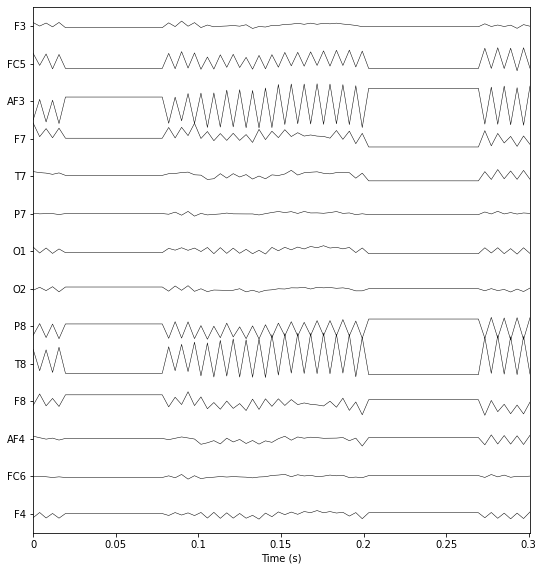

In [ ]:
raw_speaking.plot(duration = 3000, scalings = 0.001)

FVP = mne.viz.plot_raw(raw_speaking, duration = 0.3, scalings = 0.0001, title='3 Seconds raw speaking data across all 14 channels', show_scrollbars=False, show_scalebars=False)

In [ ]:
# Create an events array and dictionary for the loading of the data into an mne Epochs format (In the case of the speaking data)...

events_speaking = mne.make_fixed_length_events(raw_speaking, start=0, stop=4504, duration=2)

events_dict = {'Visual/Ambulance' : 1,
               'Visual/Hospital' : 2,
               'Visual/Clock' : 3,
               'Visual/Lamp' : 4,
               'Audio/Ambulance' : 5,
               'Audio/Hospital' : 6,
               'Audio/Clock' : 7,
               'Audio/Lamp' : 8,
               'Text/Ambulance' : 9,
               'Text/Hospital' : 10,
               'Text/Clock' : 11,
               'Text/Lamp' : 12,
               'None' : 13}

events_speaking[((np.array(modes_of_stimuli) == 'image')*(np.array(targets) == 'Hospital')), 2] = np.array([2 for i in range(((np.array(modes_of_stimuli) == 'image')*(np.array(targets) == 'Hospital')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'image')*(np.array(targets) == 'Clock')), 2] = np.array([3 for i in range(((np.array(modes_of_stimuli) == 'image')*(np.array(targets) == 'Clock')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'image')*(np.array(targets) == 'Lamp')), 2] = np.array([4 for i in range(((np.array(modes_of_stimuli) == 'image')*(np.array(targets) == 'Lamp')).sum())])

events_speaking[((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Ambulance')), 2] = np.array([5 for i in range(((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Ambulance')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Hospital')), 2] = np.array([6 for i in range(((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Hospital')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Clock')), 2] = np.array([7 for i in range(((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Clock')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Lamp')), 2] = np.array([8 for i in range(((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Lamp')).sum())])

events_speaking[((np.array(modes_of_stimuli) == 'text')*(np.array(targets) == 'Ambulance')), 2] = np.array([9 for i in range(((np.array(modes_of_stimuli) == 'text')*(np.array(targets) == 'Ambulance')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'text')*(np.array(targets) == 'Hospital')), 2] = np.array([10 for i in range(((np.array(modes_of_stimuli) == 'text')*(np.array(targets) == 'Hospital')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'text')*(np.array(targets) == 'Clock')), 2] = np.array([11 for i in range(((np.array(modes_of_stimuli) == 'text')*(np.array(targets) == 'Clock')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'text')*(np.array(targets) == 'Lamp')), 2] = np.array([12 for i in range(((np.array(modes_of_stimuli) == 'text')*(np.array(targets) == 'Lamp')).sum())])

events_speaking[np.array(modes_of_stimuli) == 'None', 2] = np.array([13 for i in range((np.array(modes_of_stimuli) == 'None').sum())])


for i in range(1, 14):
  print(f'Number of events with code {i} = ', (events_speaking[:, 2] == i).sum())




Number of events with code 1 =  100
Number of events with code 2 =  90
Number of events with code 3 =  90
Number of events with code 4 =  80
Number of events with code 5 =  90
Number of events with code 6 =  80
Number of events with code 7 =  100
Number of events with code 8 =  80
Number of events with code 9 =  90
Number of events with code 10 =  90
Number of events with code 11 =  80
Number of events with code 12 =  90
Number of events with code 13 =  90


Not setting metadata
1150 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 1150 events and 512 original time points ...
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['F7', 'T7', 'F8', 'AF4']
    Rejecting  epoch based on EEG : ['F7', 'T7', 'F8', 'AF4']
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['F7', 'T7', 'F8', 'AF4']
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['T7', 'AF4']
    Rejecting  epoch based on EEG : ['F7', 'T7', 'F8', 'AF4']
    Rejecting  epoch based on EEG : ['F7', 'T7', 'F8', 'AF4']
    Rejecting  epoch based on EEG : ['F7', 'T7', 'F8', 'AF4']
    Rejecting  epoch based on 

<ipython-input-38-0d6315bee4dd>:8: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  speaking_epoched.plot(events = events_speaking, n_epochs=40, scalings = 0.002)
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


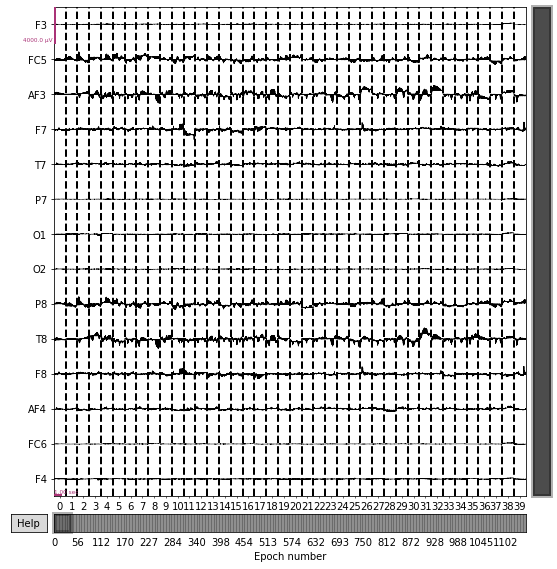

    Using multitaper spectrum estimation with 7 DPSS windows


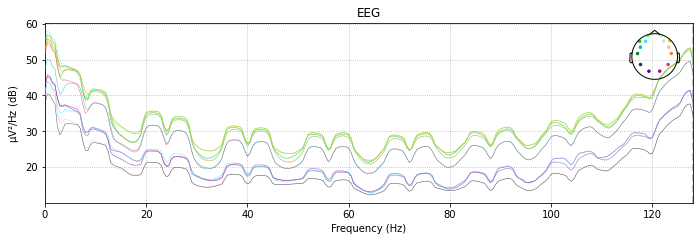

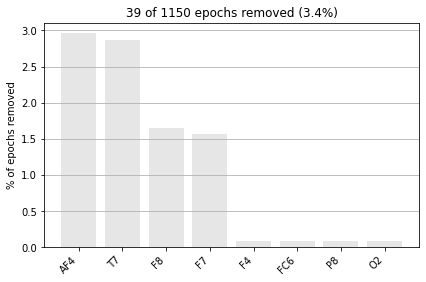

No projector specified for this dataset. Please consider the method self.add_proj.


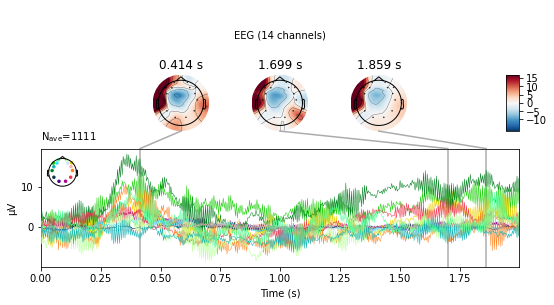

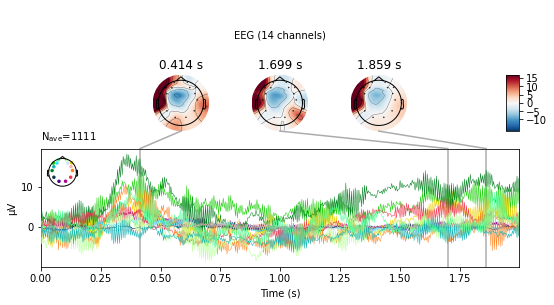

In [ ]:
#Load the data into the epochs class, with rejection threshold set at 0.002 Volts...

reject_criteria = {'eeg' : 0.002}
speaking_epoched = mne.Epochs(raw_speaking, tmin=0, tmax = 2-1/256, baseline=(0, 0), events = events_speaking, event_id=events_dict,
                              reject=reject_criteria,
                              reject_by_annotation=False, preload = True)

speaking_epoched.plot(events = events_speaking, n_epochs=40, scalings = 0.002)
speaking_epoched.plot_psd()
speaking_epoched.plot_drop_log()
speaking_epoched.average().plot_joint()

In [ ]:
speaking_epoched

Number of events,1111
Events,Audio/Ambulance: 85Audio/Clock: 100Audio/Hospital: 77Audio/Lamp: 80None: 82Text/Ambulance: 90Text/Clock: 80Text/Hospital: 84Text/Lamp: 88Visual/Ambulance: 97Visual/Clock: 87Visual/Hospital: 82Visual/Lamp: 79
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


In [ ]:
speaking_epoched.equalize_event_counts(event_ids=None, method='mintime')# Equalise event counts through the minimum time method (https://mne.tools/dev/generated/mne.Epochs.html#mne.Epochs.equalize_event_counts)

Dropped 110 epochs: 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 60, 61, 62, 63, 64, 70, 130, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 305, 494, 495, 496, 497, 498, 499, 790, 846, 847, 858, 859, 860, 861, 862, 863, 864, 865, 866, 867, 895, 896, 897, 935, 936, 937, 938, 939, 940, 941, 942, 943, 1045, 1046, 1047, 1048, 1049, 1050, 1051, 1052, 1067, 1068, 1069, 1070, 1071, 1079, 1080, 1081, 1100, 1101, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1109, 1110


(<Epochs |  1001 events (all good), 0 - 1.99609 sec, baseline 0 – 0 sec, ~54.8 MB, data loaded,
  'Visual/Ambulance': 77
  'Visual/Hospital': 77
  'Visual/Clock': 77
  'Visual/Lamp': 77
  'Audio/Ambulance': 77
  'Audio/Hospital': 77
  'Audio/Clock': 77
  'Audio/Lamp': 77
  'Text/Ambulance': 77
  'Text/Hospital': 77
  and 3 more events ...>,
 array([  10,   11,   12,   13,   14,   15,   16,   17,   18,   19,   20,
         935,  936,  937,  938,  939,  940,  941,  942,  943, 1067, 1068,
        1069, 1070, 1071,  140,  141,  142,  143,  144,  145,  146,  147,
         148,  149,  130,  790, 1045, 1046, 1047, 1048, 1049, 1050, 1051,
        1052,   30,   31,   32,   33,   34,   35,   36,   37,   38,   39,
         305,  846,  847,  858,  859,  860,  861,  862,  863,  864,  865,
         866,  867, 1079, 1080, 1081,   40,   41,   42,   43,   44,   45,
          46,   47,   48,   49,   50,   51,   52,   70,  494,  495,  496,
         497,  498,  499,  895,  896,  897, 1100, 1101, 1102, 110

In [ ]:
speaking_epoched

Number of events,1001
Events,Audio/Ambulance: 77Audio/Clock: 77Audio/Hospital: 77Audio/Lamp: 77None: 77Text/Ambulance: 77Text/Clock: 77Text/Hospital: 77Text/Lamp: 77Visual/Ambulance: 77Visual/Clock: 77Visual/Hospital: 77Visual/Lamp: 77
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


    Using multitaper spectrum estimation with 7 DPSS windows


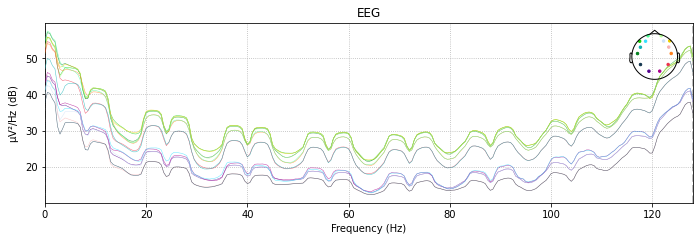

Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 845 samples (3.301 sec)



<ipython-input-42-e73bf749a77d>:2: RuntimeWarning: filter_length (845) is longer than the signal (512), distortion is likely. Reduce filter length or filter a longer signal.
  speaking_epoched_filt = speaking_epoched.copy().filter(l_freq = 1, h_freq = None)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


    Using multitaper spectrum estimation with 7 DPSS windows


[Parallel(n_jobs=1)]: Done 14014 out of 14014 | elapsed:    3.3s finished


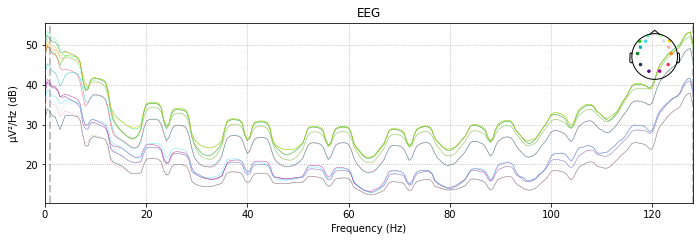

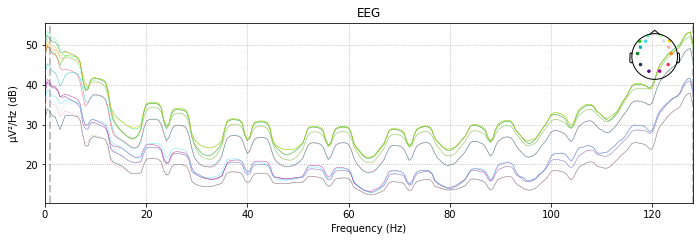

In [ ]:
speaking_epoched.plot_psd()
speaking_epoched_filt = speaking_epoched.copy().filter(l_freq = 1, h_freq = None)
speaking_epoched_filt.plot_psd()

Fitting ICA to data using 14 channels (please be patient, this may take a while)


<ipython-input-43-6b3e3f7e1c96>:4: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica.fit(speaking_epoched_filt)


Selecting by non-zero PCA components: 14 components
Fitting ICA took 9.9s.
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1001 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1001 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1001 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1001 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1001 matching events found
No baseline correction applied
0 projection items activated


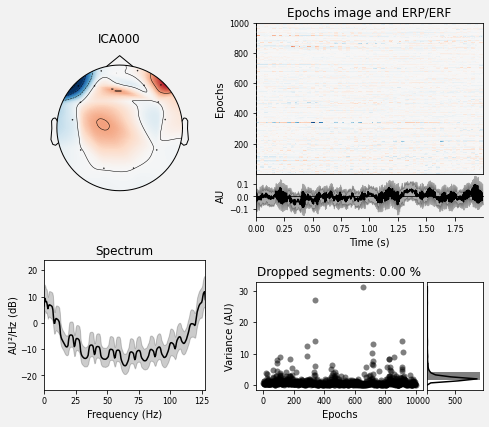

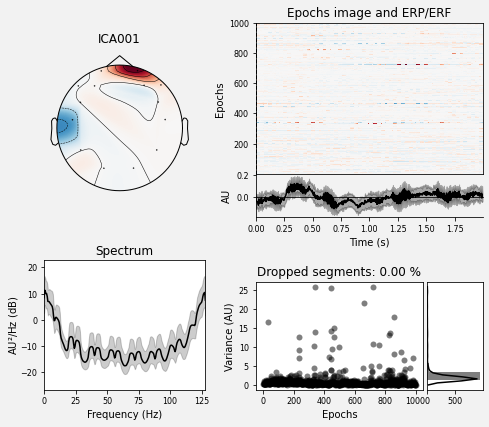

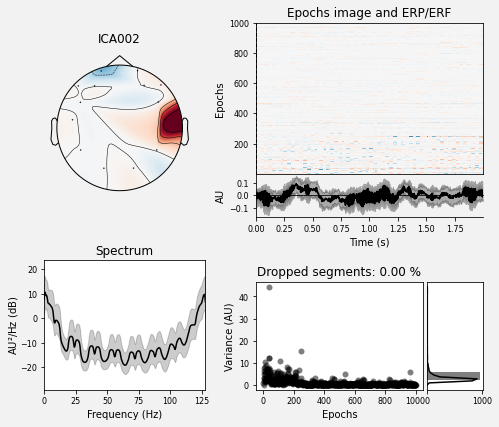

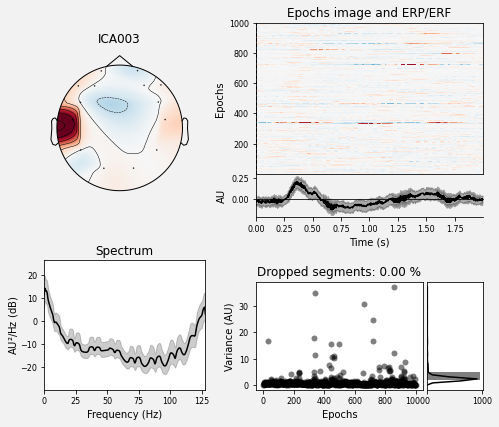

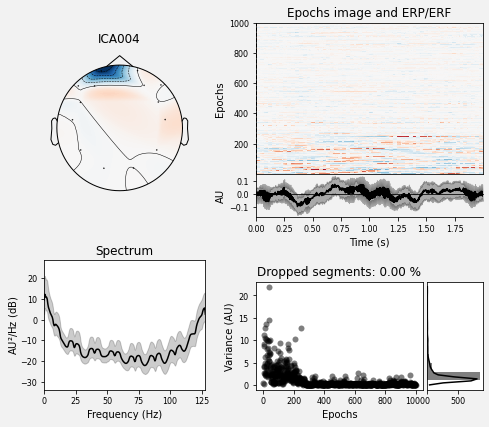

Not setting metadata
1001 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-43-6b3e3f7e1c96>:6: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  ica.plot_sources(speaking_epoched_filt)
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


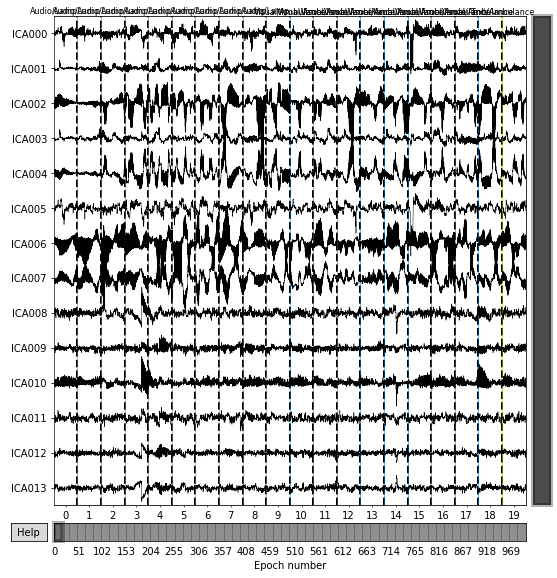

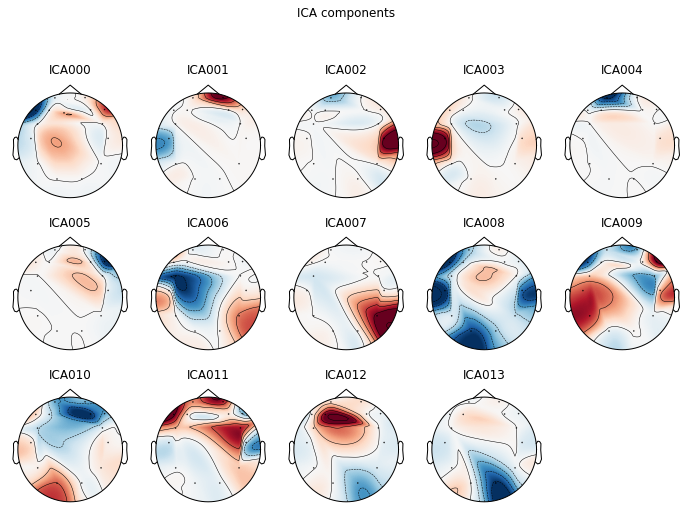

[<MNEFigure size 702x526.68 with 14 Axes>]

In [ ]:
# Fitting of ICA and plot of various graphs for analysis...

ica = mne.preprocessing.ICA()
ica.fit(speaking_epoched_filt)
ica.plot_properties(speaking_epoched_filt)
ica.plot_sources(speaking_epoched_filt)
ica.plot_components()


In [ ]:
# input into the ICA class which components to exclude, then apply the transformation to the raw unfiltered data...
ica.exclude = [0]
speaking_processed_mne_epoched = speaking_epoched_filt.copy()
ica.apply(speaking_processed_mne_epoched)

Applying ICA to Epochs instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components


<ipython-input-44-a59eaf53466d>:4: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica.apply(speaking_processed_mne_epoched)


Number of events,1001
Events,Audio/Ambulance: 77Audio/Clock: 77Audio/Hospital: 77Audio/Lamp: 77None: 77Text/Ambulance: 77Text/Clock: 77Text/Hospital: 77Text/Lamp: 77Visual/Ambulance: 77Visual/Clock: 77Visual/Hospital: 77Visual/Lamp: 77
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


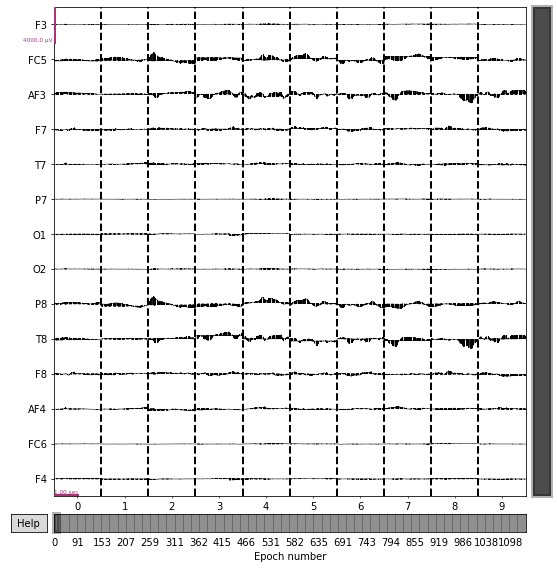

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


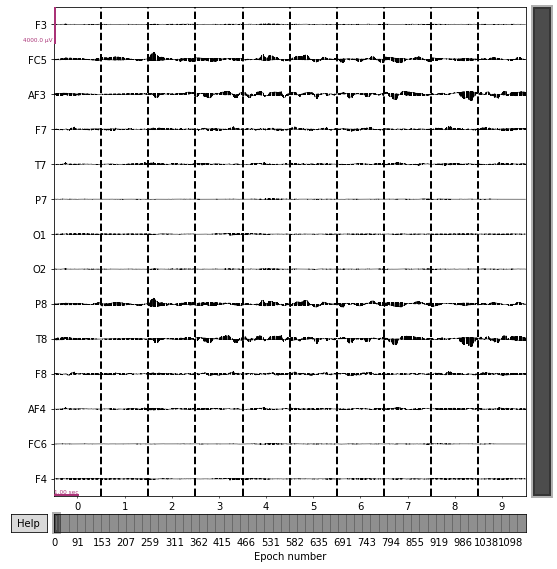

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


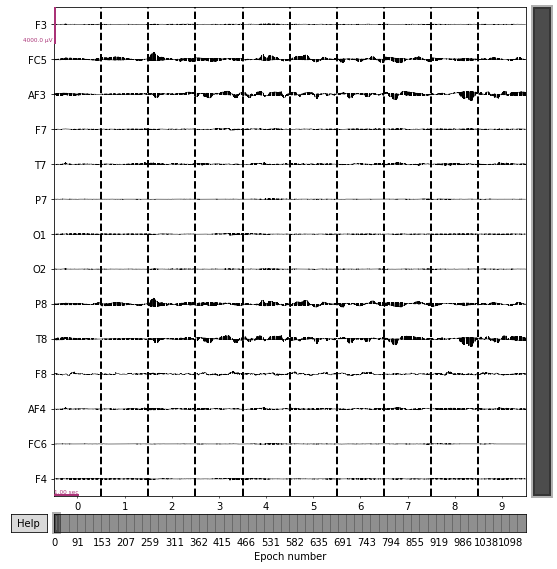

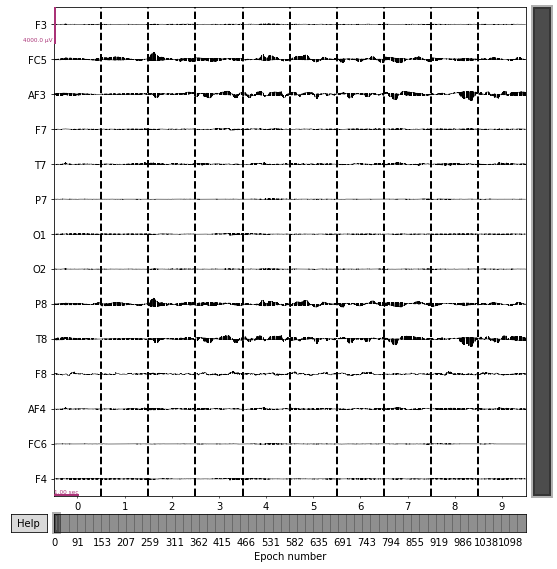

In [ ]:
# Plots of Filtered, unfiltered and ICA processed data...
speaking_epoched.plot(n_epochs=10, scalings = 0.002)
speaking_epoched_filt.plot(n_epochs=10, scalings = 0.002)
speaking_processed_mne_epoched.plot(n_epochs=10, scalings = 0.002)

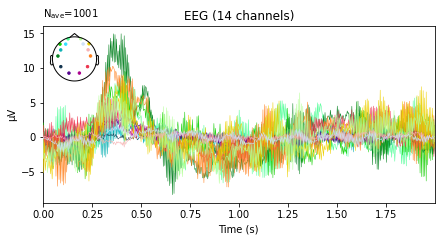

In [ ]:
# Evoked response throughout all modes of stimuli...
ER_all_speaking = speaking_epoched_filt.average()
fig2 = ER_all_speaking.plot(spatial_colors=True)

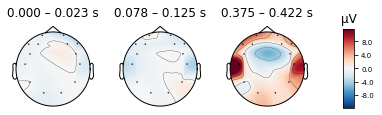

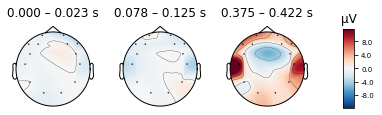

In [ ]:
ER_all_speaking.plot_topomap(times=[0, 0.1, 0.4], average=0.05)

No projector specified for this dataset. Please consider the method self.add_proj.


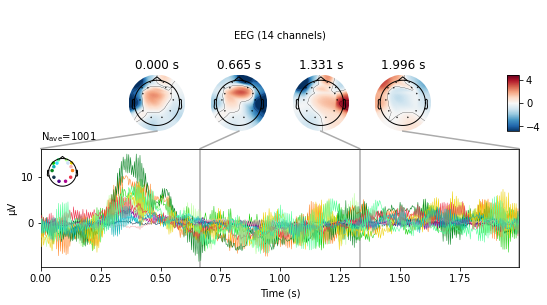

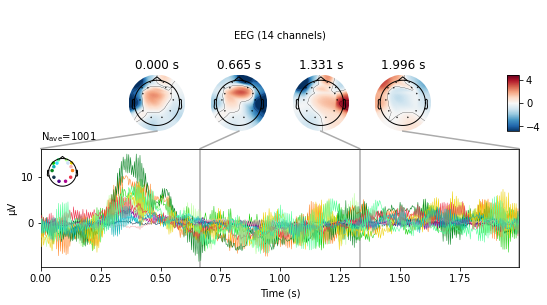

In [ ]:
ER_all_speaking.plot_joint(times='auto')

In [ ]:
# Find the average for each mode of stimuli...
average_aud = speaking_epoched_filt['Audio'].average()
average_text = speaking_epoched_filt['Text'].average()
average_viz = speaking_epoched_filt['Visual'].average()
average_hospital = speaking_epoched_filt['Hospital'].average()
average_ambulance = speaking_epoched_filt['Ambulance'].average()
average_clock = speaking_epoched_filt['Clock'].average()
average_lamp = speaking_epoched_filt['Lamp'].average()

average_aud_hospital = speaking_epoched_filt['Audio/Hospital'].average()
average_text_hospital = speaking_epoched_filt['Text/Hospital'].average()
average_viz_hospital = speaking_epoched_filt['Visual/Hospital'].average()
average_aud_ambulance = speaking_epoched_filt['Audio/Ambulance'].average()
average_text_ambulance = speaking_epoched_filt['Text/Ambulance'].average()
average_viz_ambulance = speaking_epoched_filt['Visual/Clock'].average()
average_aud_clock = speaking_epoched_filt['Audio/Clock'].average()
average_text_clock = speaking_epoched_filt['Text/Clock'].average()
average_viz_clock = speaking_epoched_filt['Visual/Clock'].average()
average_aud_lamp = speaking_epoched_filt['Audio/Lamp'].average()
average_text_lamp = speaking_epoched_filt['Text/Lamp'].average()
average_viz_lamp = speaking_epoched_filt['Visual/Lamp'].average()
average_rest = speaking_epoched_filt['None'].average()

No projector specified for this dataset. Please consider the method self.add_proj.


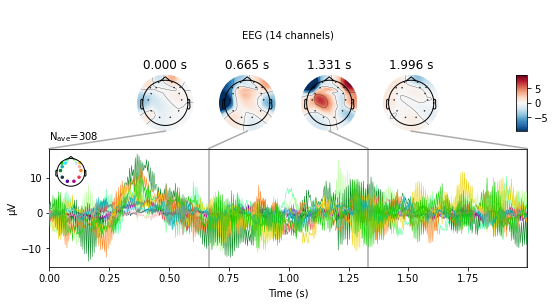

No projector specified for this dataset. Please consider the method self.add_proj.


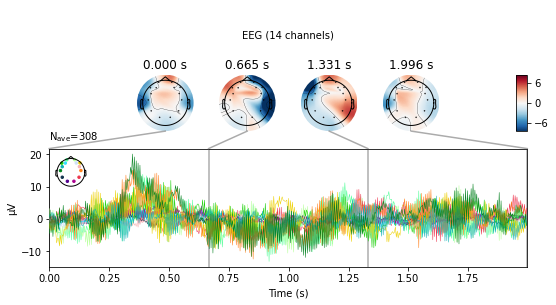

No projector specified for this dataset. Please consider the method self.add_proj.


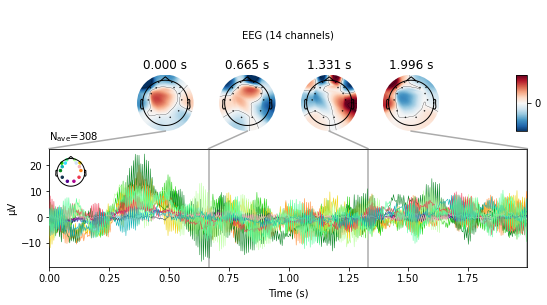

No projector specified for this dataset. Please consider the method self.add_proj.


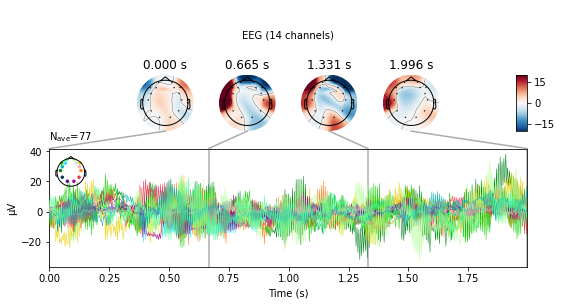

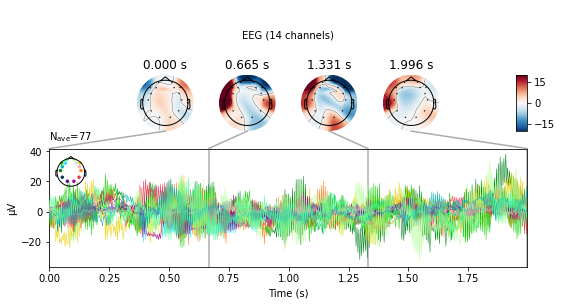

In [ ]:
# Joint plot of average repsonse for 14 channels with topography overplot...
# For Audio, Visual, and text...
average_aud.plot_joint(times='auto')
average_text.plot_joint(times='auto')
average_viz.plot_joint(times='auto')
average_rest.plot_joint(times = 'auto')

In [ ]:
# Creation of independant lists for different brain regions of interest...
occipital = ['O1', 'O2']
temporal = ['T7', 'T8']
broca = ['F7']
ch_names


['F3',
 'FC5',
 'AF3',
 'F7',
 'T7',
 'P7',
 'O1',
 'O2',
 'P8',
 'T8',
 'F8',
 'AF4',
 'FC6',
 'F4']

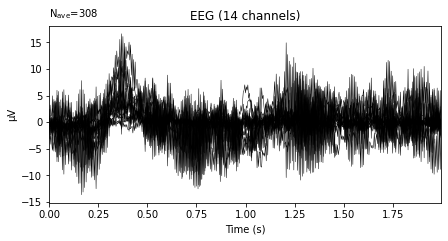

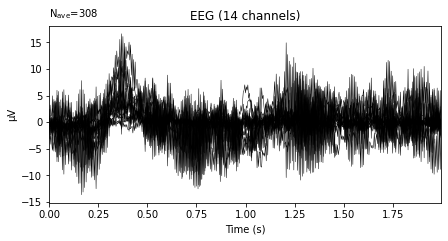

In [ ]:
average_aud.plot()

More than 6 channels, truncating title ...
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


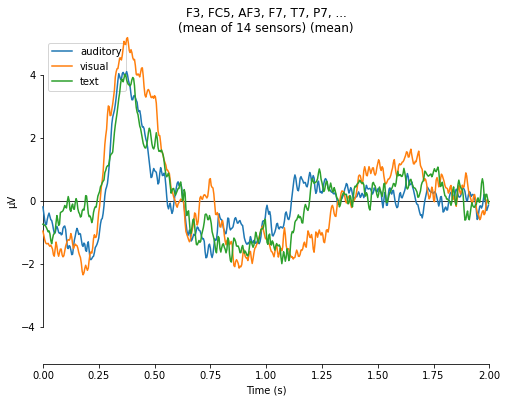

[<Figure size 576x432 with 1 Axes>]

In [ ]:
# Plot of evoked responses for all channels averaged ...
evokeds = dict(auditory=average_aud, visual=average_viz, text=average_text)
picks = [ch_names[n] for n in range(0, 14)]
mne.viz.plot_compare_evokeds(evokeds, picks, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


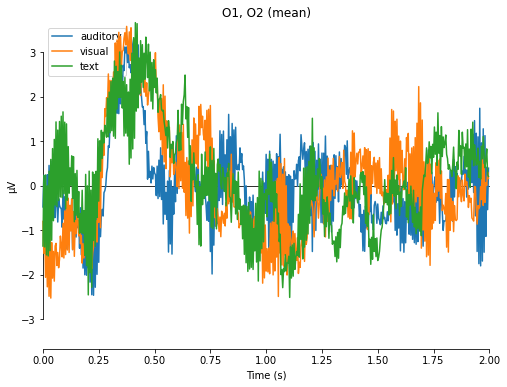

[<Figure size 576x432 with 1 Axes>]

In [ ]:
# Plot of evoked responses for Occipital regions averaged ...
mne.viz.plot_compare_evokeds(evokeds, picks = occipital, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


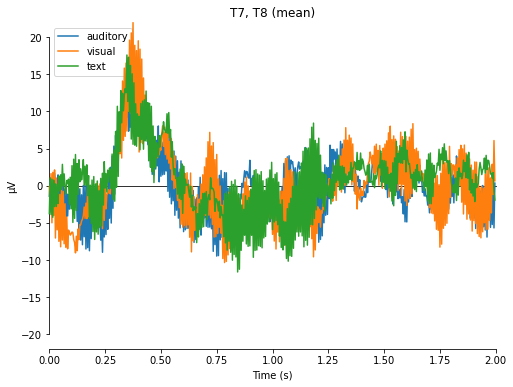

[<Figure size 576x432 with 1 Axes>]

In [ ]:
# Plot of evoked responses for regions averaged...
mne.viz.plot_compare_evokeds(evokeds, picks = temporal, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


<ipython-input-56-2a2acca60a80>:2: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')


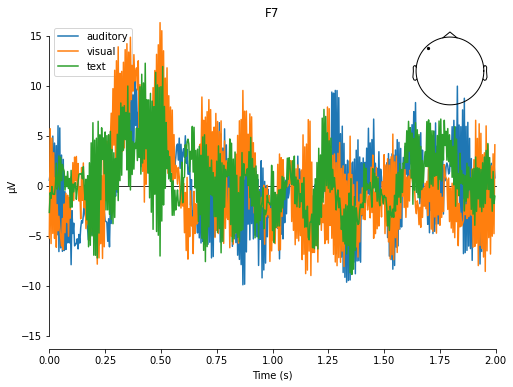

[<Figure size 576x432 with 2 Axes>]

In [ ]:
# Plot of evoked responses for brocas area averaged ...
mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')

More than 6 channels, truncating title ...
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


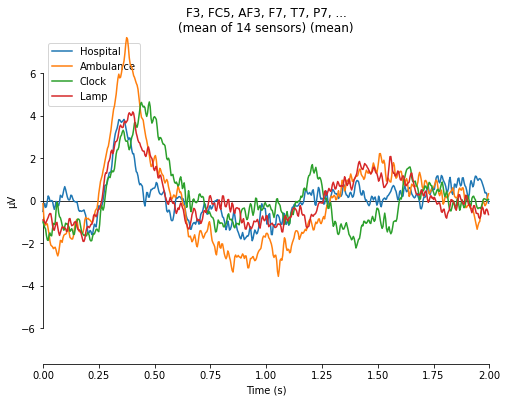

[<Figure size 576x432 with 1 Axes>]

In [ ]:
# Plot of evoked responses for all channels averaged ...
evokeds = dict(Hospital=average_hospital, Ambulance=average_ambulance, Clock=average_clock, Lamp=average_lamp)
picks = [ch_names[n] for n in range(0, 14)]
mne.viz.plot_compare_evokeds(evokeds, picks, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


<ipython-input-58-2a2acca60a80>:2: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')


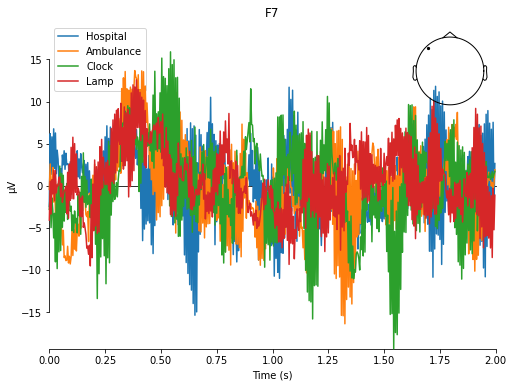

[<Figure size 576x432 with 2 Axes>]

In [ ]:
# Plot of evoked responses for brocas area averaged ...
mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')

Audio preprocessing...

<Epochs |  308 events (all good), 0 - 1.99609 sec, baseline 0 – 0 sec, ~16.9 MB, data loaded,
 'Audio/Ambulance': 77
 'Audio/Hospital': 77
 'Audio/Clock': 77
 'Audio/Lamp': 77>


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


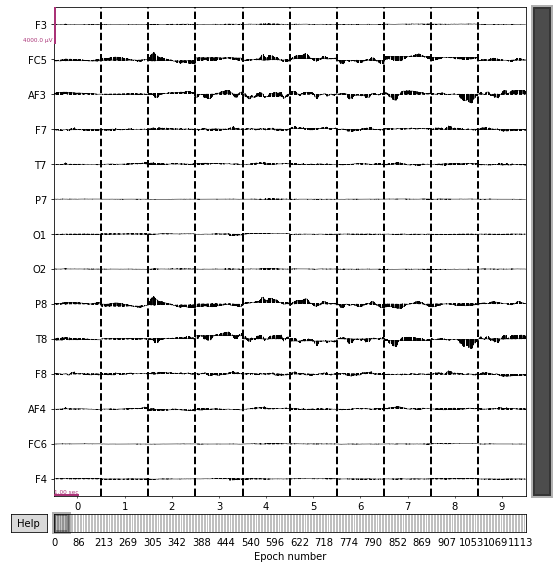

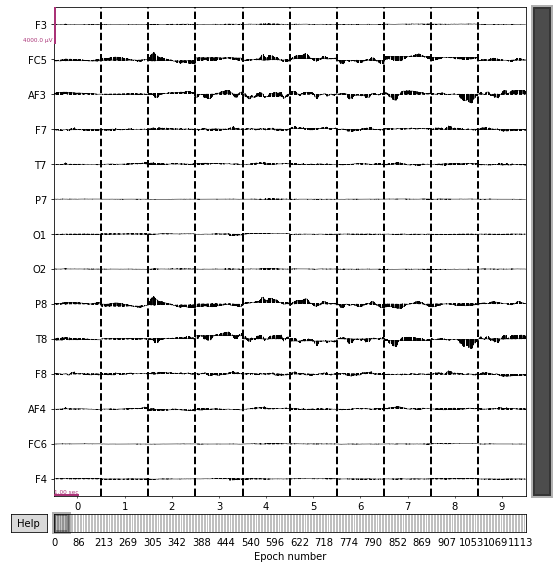

In [ ]:
# Create epochs dataset for audio data only...
print(speaking_epoched['Audio'])
audio_mne = speaking_epoched['Audio']
audio_mne.plot(n_epochs = 10, scalings = 0.002)

    Using multitaper spectrum estimation with 7 DPSS windows


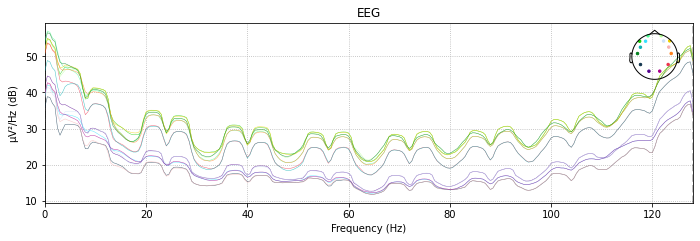

Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 845 samples (3.301 sec)



<ipython-input-60-1779e86b2f82>:4: RuntimeWarning: filter_length (845) is longer than the signal (512), distortion is likely. Reduce filter length or filter a longer signal.
  audio_mne_filt = audio_mne.copy().filter(l_freq = 1, h_freq = None)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


    Using multitaper spectrum estimation with 7 DPSS windows


[Parallel(n_jobs=1)]: Done 4312 out of 4312 | elapsed:    1.0s finished


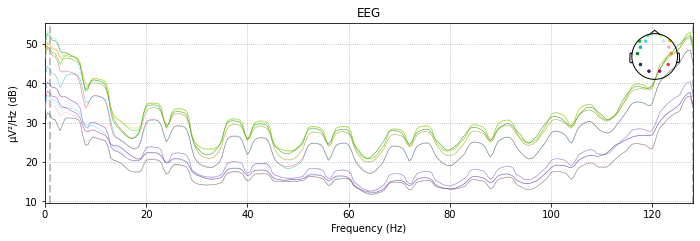

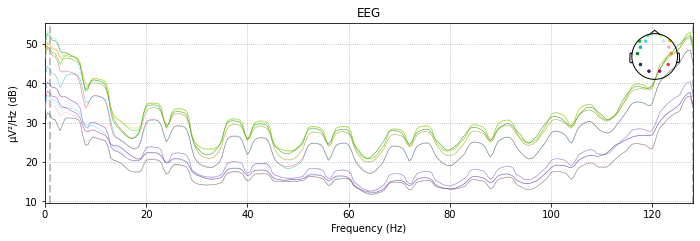

In [ ]:
# High pass Filter audio data at 1Hz...

audio_mne.plot_psd()
audio_mne_filt = audio_mne.copy().filter(l_freq = 1, h_freq = None)
audio_mne_filt.plot_psd()

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 14 components


<ipython-input-61-d255ffdfdaf1>:4: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica_aud.fit(audio_mne_filt)


Fitting ICA took 2.4s.
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated


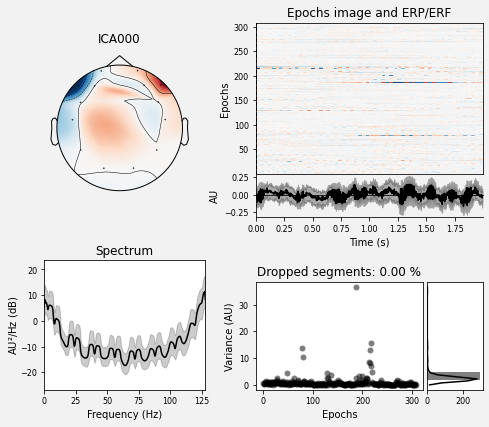

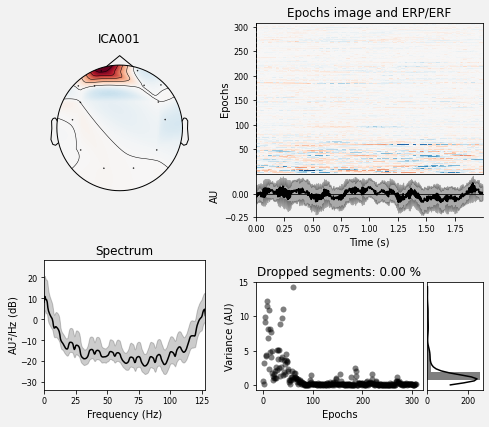

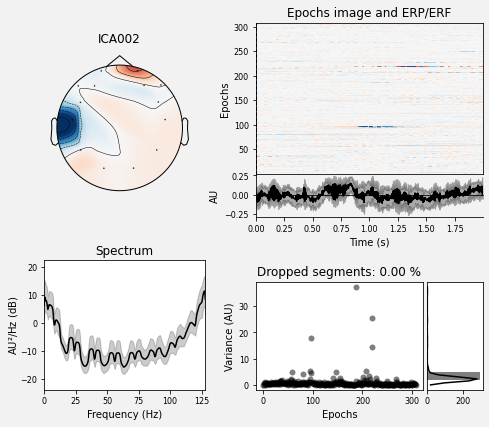

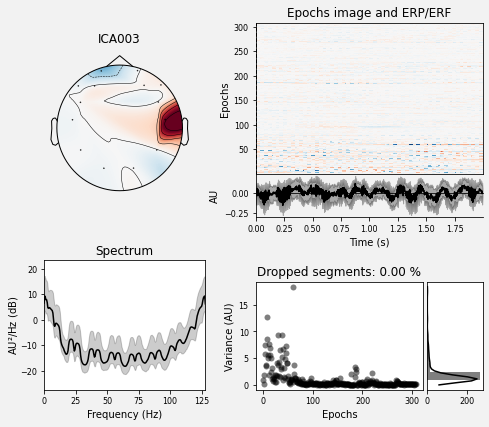

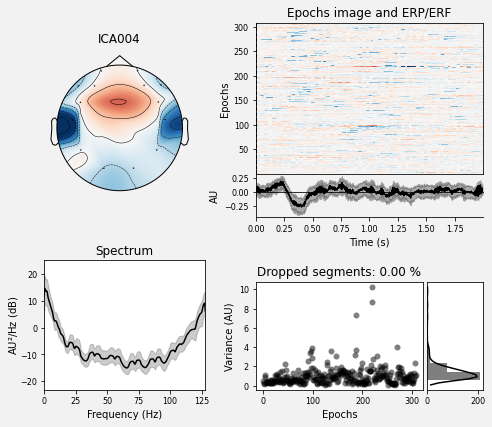

Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


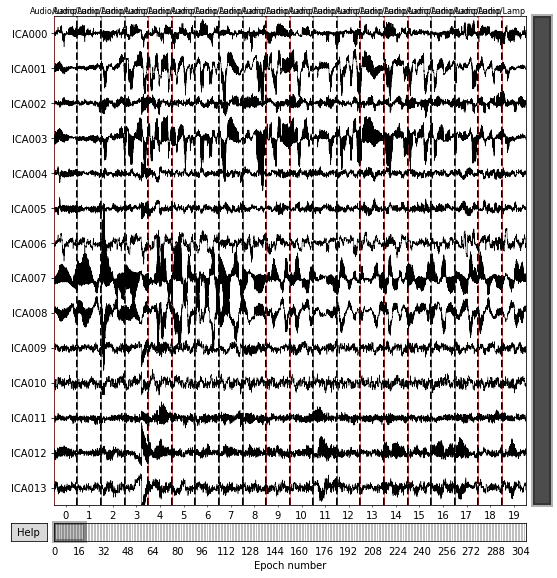

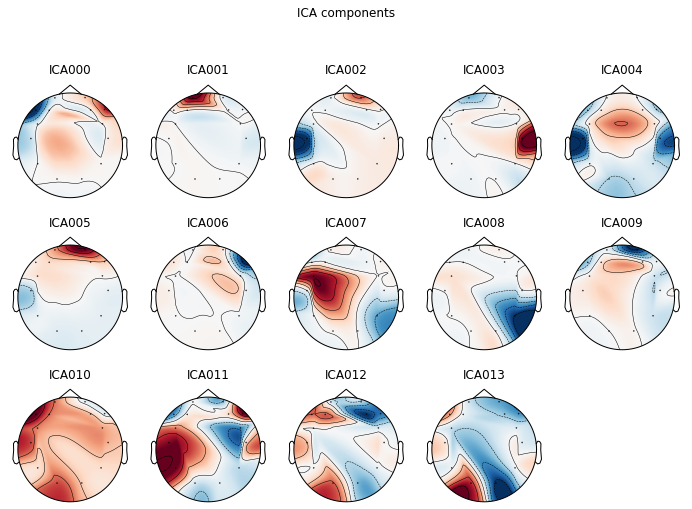

[<MNEFigure size 702x526.68 with 14 Axes>]

In [ ]:
# Perform ICA on the audio data...

ica_aud = mne.preprocessing.ICA()
ica_aud.fit(audio_mne_filt)
ica_aud.plot_properties(audio_mne_filt)
ica_aud.plot_sources(audio_mne_filt)
ica_aud.plot_components()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated


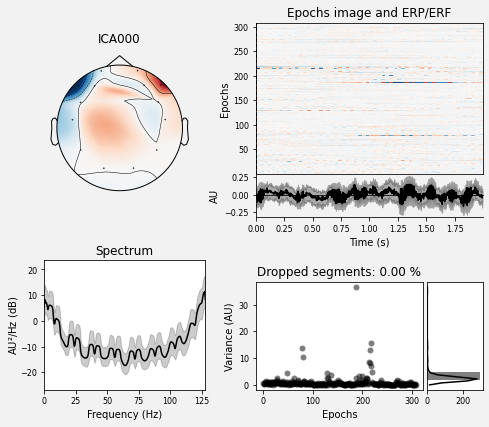

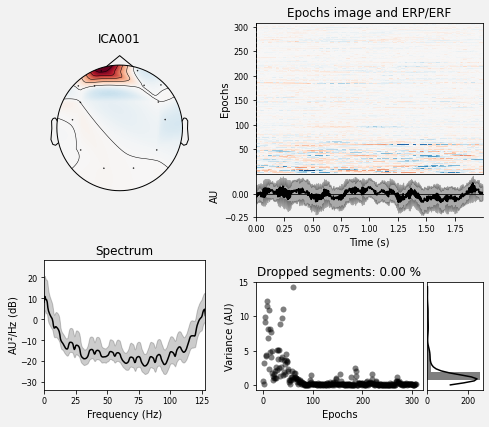

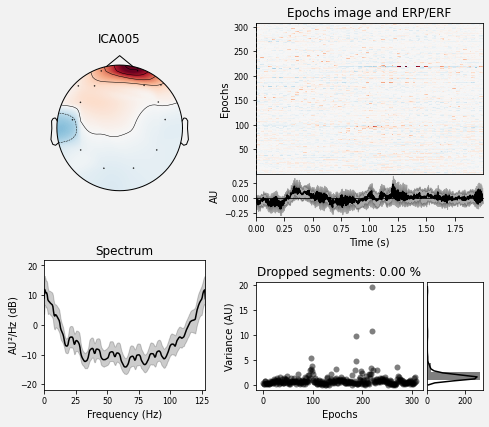

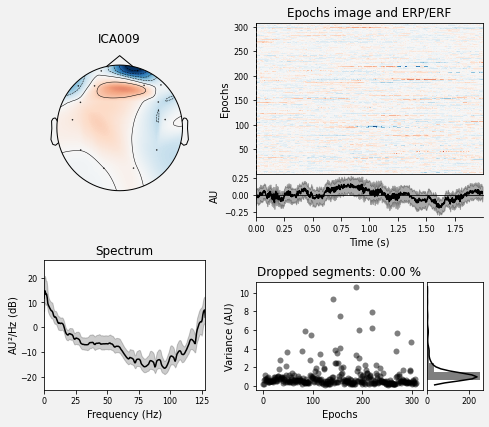

Applying ICA to Epochs instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components


<ipython-input-62-c176cdb531ba>:4: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_aud.apply(audio_mne_processed)


Number of events,308
Events,Audio/Ambulance: 77Audio/Clock: 77Audio/Hospital: 77Audio/Lamp: 77
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


In [ ]:
ica_aud.exclude = [1, 9]
ica_aud.plot_properties(audio_mne_filt, picks = [0, 1, 5, 9])
audio_mne_processed = audio_mne.copy()
ica_aud.apply(audio_mne_processed)

Text processing...

<Epochs |  308 events (all good), 0 - 1.99609 sec, baseline 0 – 0 sec, ~16.9 MB, data loaded,
 'Text/Ambulance': 77
 'Text/Hospital': 77
 'Text/Clock': 77
 'Text/Lamp': 77>


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


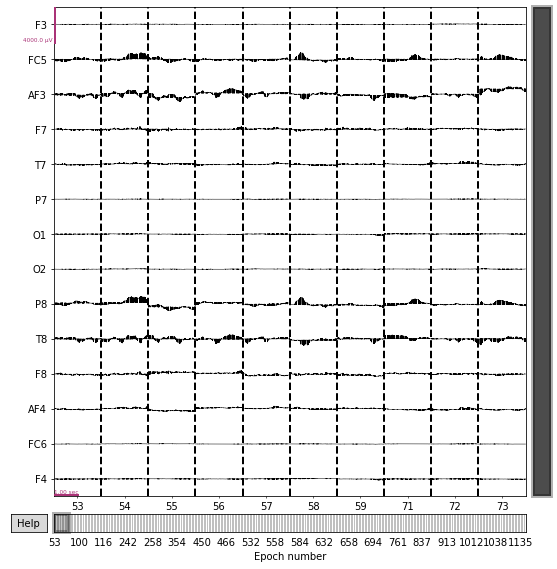

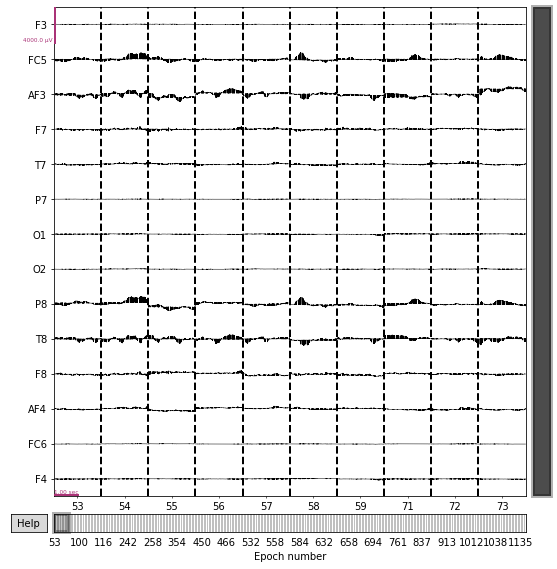

In [ ]:
# Creation of mne.Epochs text dataset...
print(speaking_epoched['Text'])
text_mne = speaking_epoched['Text']
text_mne.plot(n_epochs = 10, scalings = 0.002)

    Using multitaper spectrum estimation with 7 DPSS windows


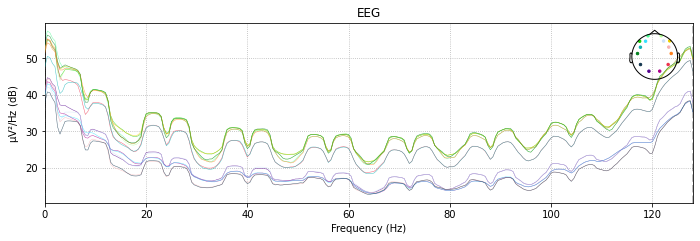

Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 845 samples (3.301 sec)



<ipython-input-64-ded2091b568e>:3: RuntimeWarning: filter_length (845) is longer than the signal (512), distortion is likely. Reduce filter length or filter a longer signal.
  text_mne_filt = text_mne.copy().filter(l_freq = 1, h_freq = None)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


    Using multitaper spectrum estimation with 7 DPSS windows


[Parallel(n_jobs=1)]: Done 4312 out of 4312 | elapsed:    1.0s finished


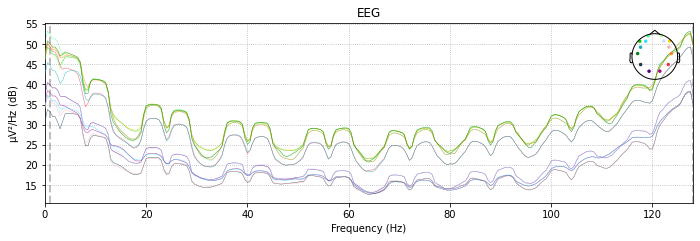

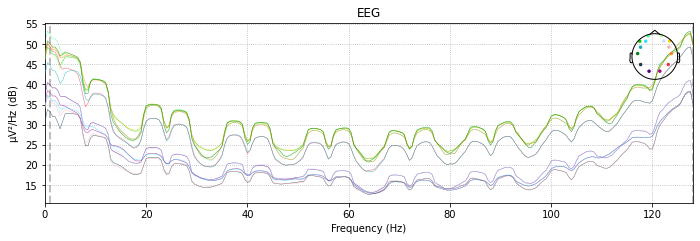

In [ ]:
# High pass filter at 1Hz, for performance of ICA...
text_mne.plot_psd()
text_mne_filt = text_mne.copy().filter(l_freq = 1, h_freq = None)
text_mne_filt.plot_psd()

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 14 components


<ipython-input-65-1b82bb868eb4>:3: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica_text.fit(text_mne_filt)


Fitting ICA took 1.8s.
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated


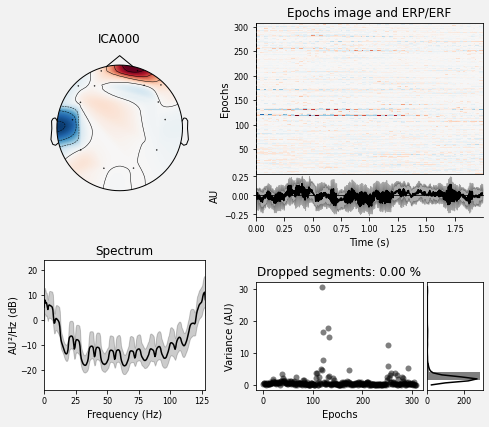

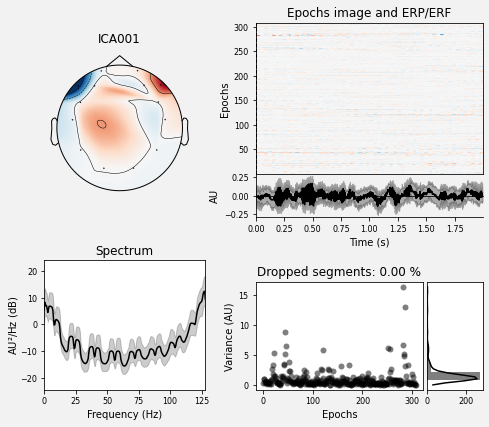

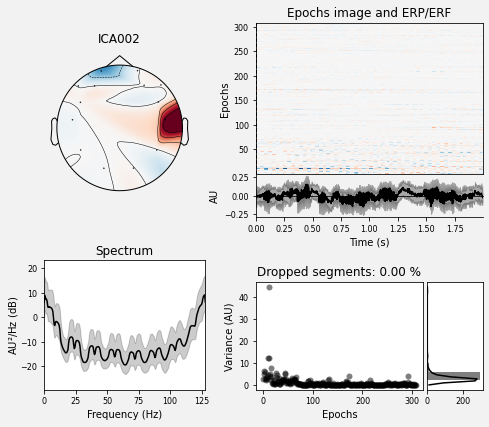

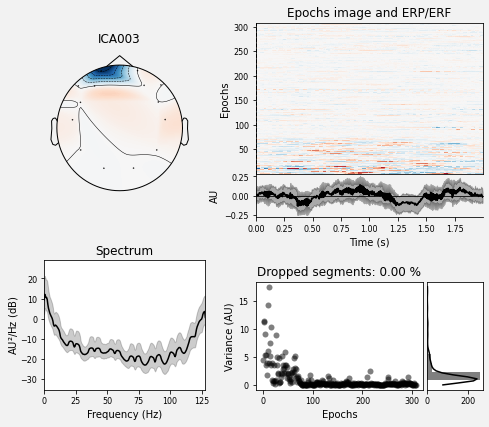

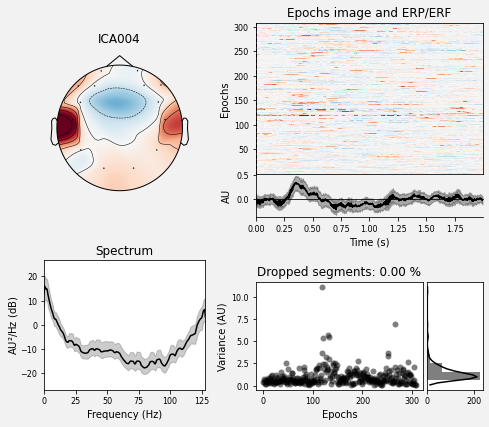

Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


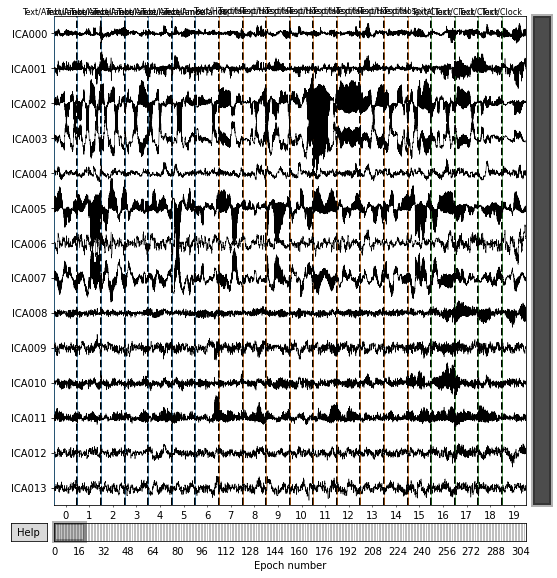

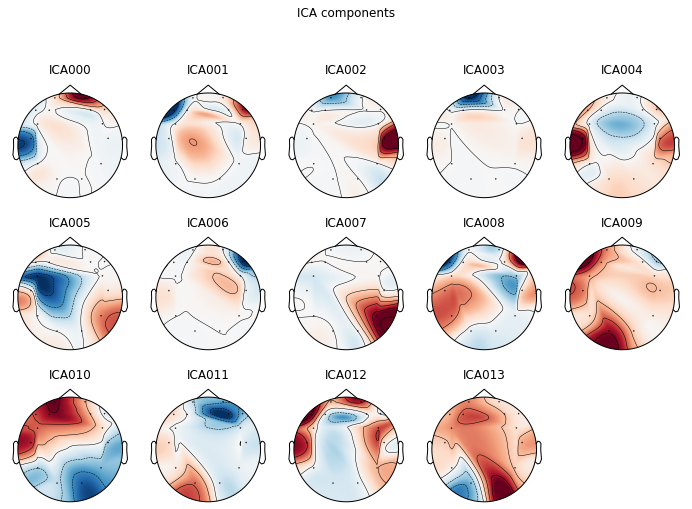

[<MNEFigure size 702x526.68 with 14 Axes>]

In [ ]:
# Performance of ICA on text data
ica_text = mne.preprocessing.ICA()
ica_text.fit(text_mne_filt)
ica_text.plot_properties(text_mne_filt)
ica_text.plot_sources(text_mne_filt)
ica_text.plot_components()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated


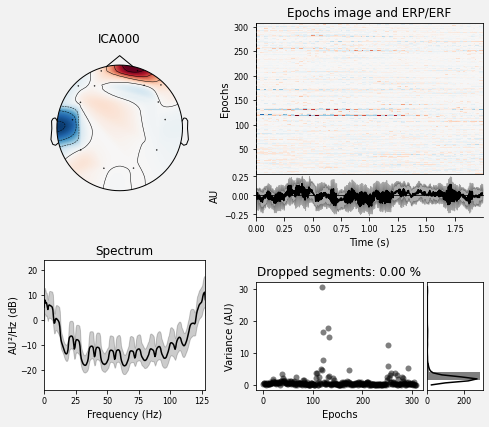

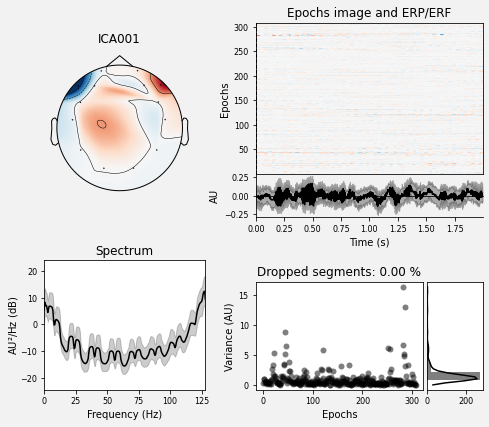

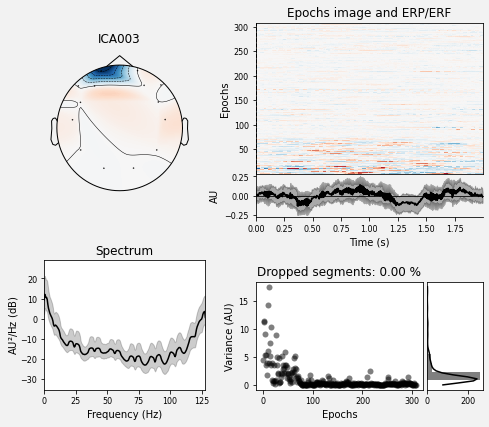

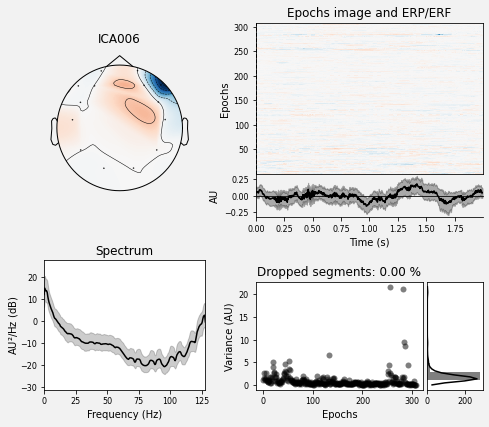

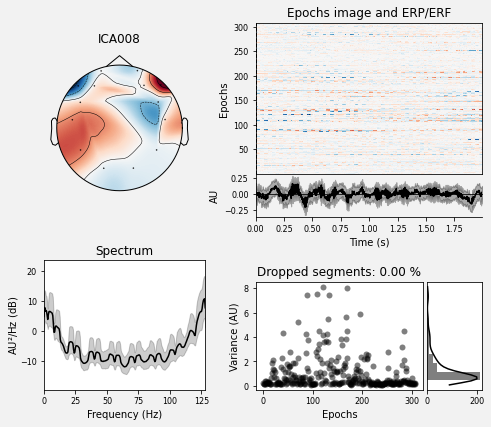

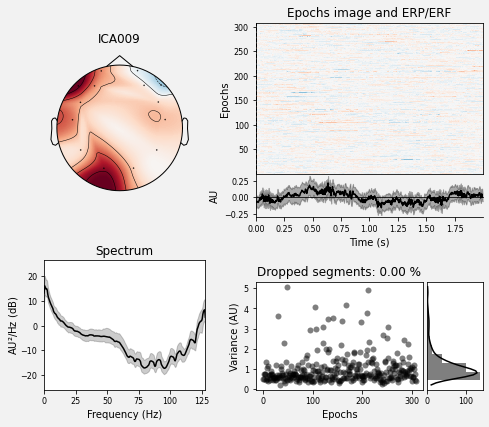

Applying ICA to Epochs instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components


<ipython-input-66-cb89a6a70c90>:4: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_text.apply(text_mne_processed)


Number of events,308
Events,Text/Ambulance: 77Text/Clock: 77Text/Hospital: 77Text/Lamp: 77
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


In [ ]:
ica_text.exclude = [1, 8]
ica_text.plot_properties(text_mne_filt, picks=[0, 1, 3, 6, 8, 9])
text_mne_processed = text_mne.copy()
ica_text.apply(text_mne_processed)

Visual processing...

<Epochs |  308 events (all good), 0 - 1.99609 sec, baseline 0 – 0 sec, ~16.9 MB, data loaded,
 'Visual/Ambulance': 77
 'Visual/Hospital': 77
 'Visual/Clock': 77
 'Visual/Lamp': 77>


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


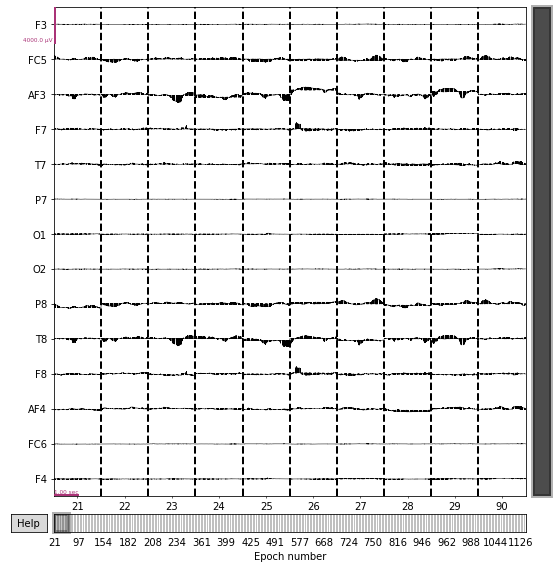

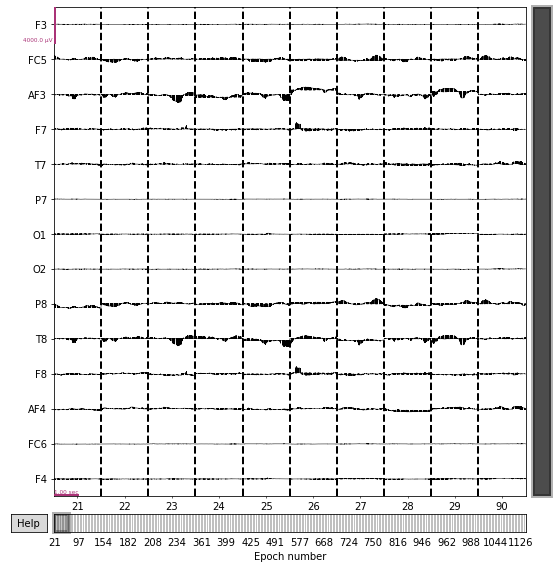

In [ ]:
# Creation of mne.Epochs dataset for visual data...

print(speaking_epoched['Visual'])
visual_mne = speaking_epoched['Visual']
visual_mne.plot(n_epochs = 10, scalings = 0.002)

    Using multitaper spectrum estimation with 7 DPSS windows


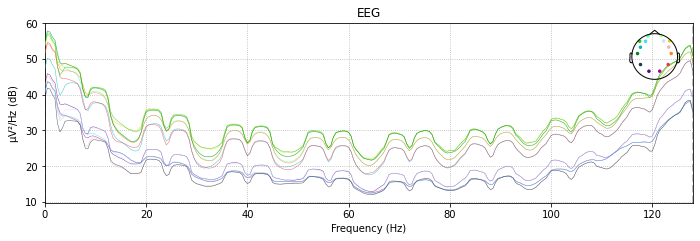

Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 845 samples (3.301 sec)



<ipython-input-68-041b8bccaf42>:3: RuntimeWarning: filter_length (845) is longer than the signal (512), distortion is likely. Reduce filter length or filter a longer signal.
  visual_mne_filt = visual_mne.copy().filter(l_freq = 1, h_freq = None)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


    Using multitaper spectrum estimation with 7 DPSS windows


[Parallel(n_jobs=1)]: Done 4312 out of 4312 | elapsed:    1.0s finished


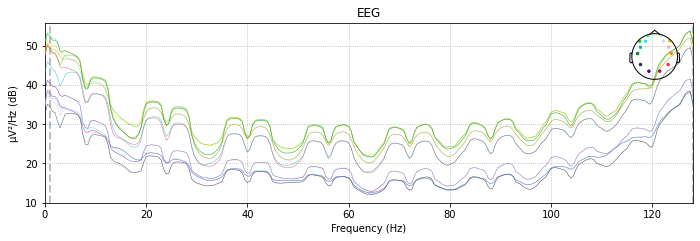

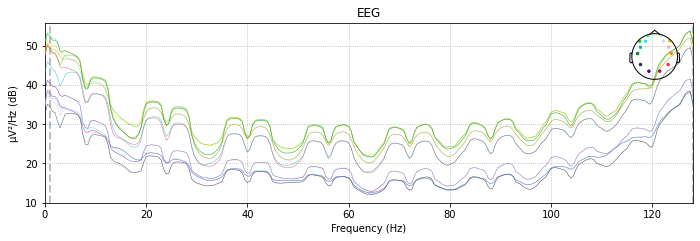

In [ ]:
# High pass filter at 1Hz, for performance of ICA
visual_mne.plot_psd()
visual_mne_filt = visual_mne.copy().filter(l_freq = 1, h_freq = None)
visual_mne_filt.plot_psd()

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 14 components


<ipython-input-69-0a60f19c4855>:3: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica_viz.fit(visual_mne_filt)


Fitting ICA took 2.8s.
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated


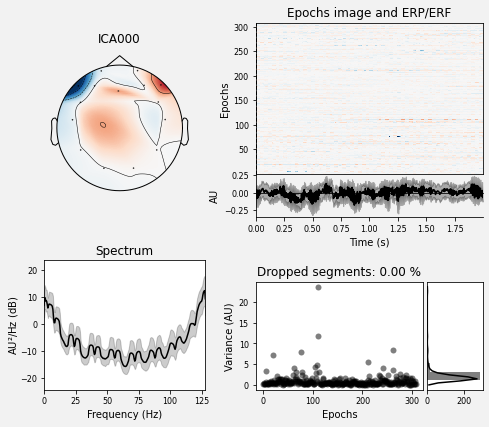

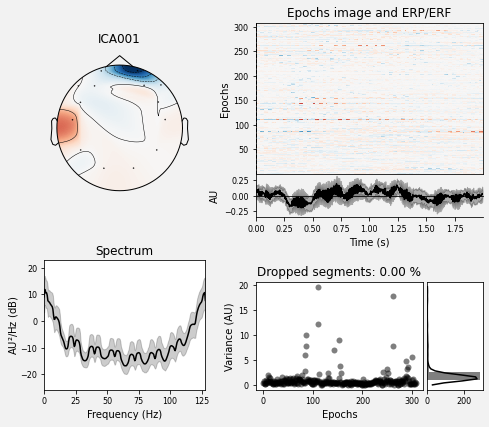

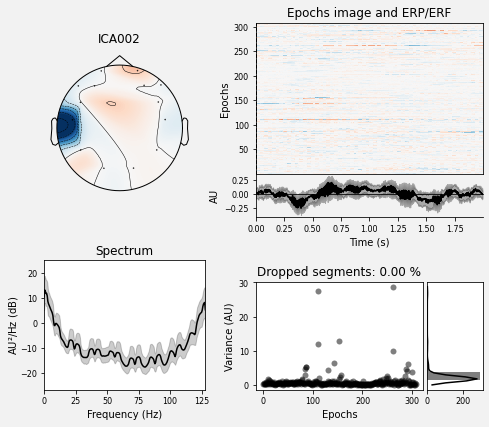

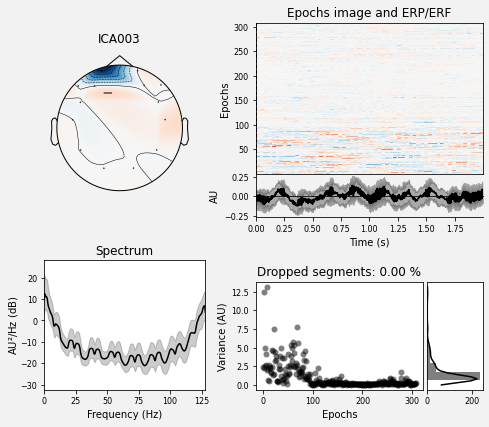

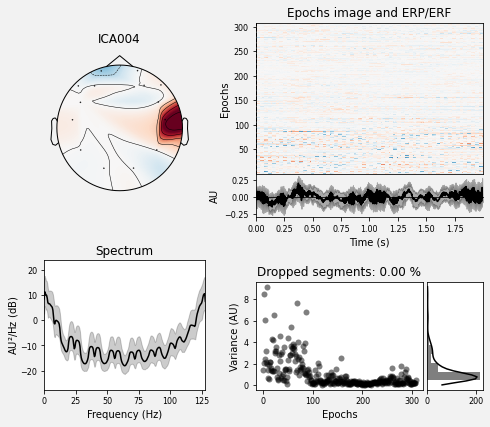

Not setting metadata
308 matching events found
No baseline correction applied
0 projection items activated


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


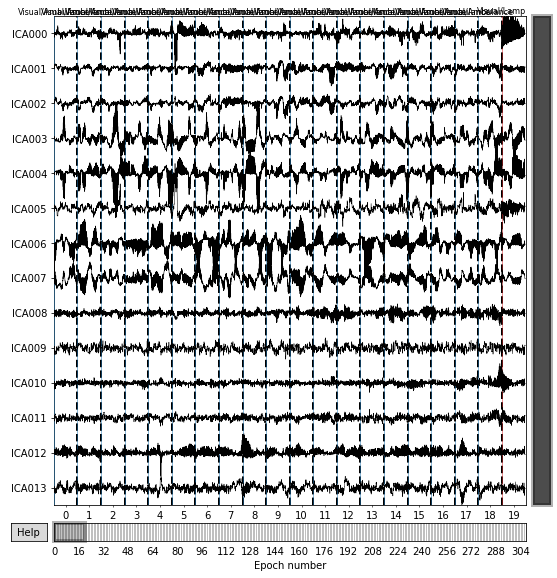

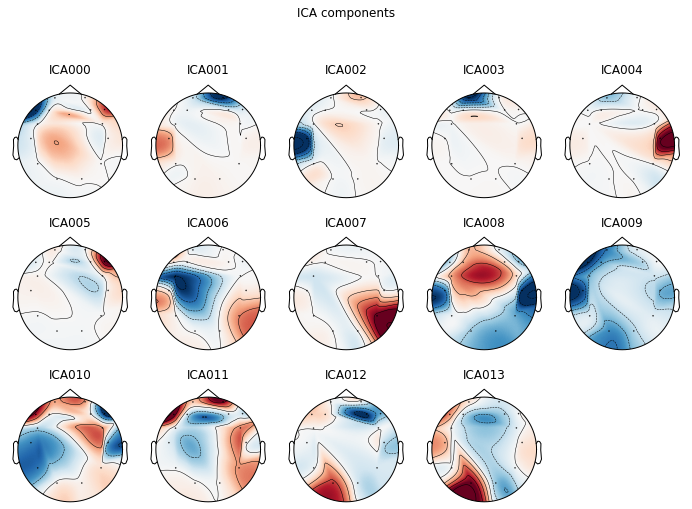

[<MNEFigure size 702x526.68 with 14 Axes>]

In [ ]:
# Performance of ICA on visual data...
ica_viz = mne.preprocessing.ICA()
ica_viz.fit(visual_mne_filt)
ica_viz.plot_properties(visual_mne_filt)
ica_viz.plot_sources(visual_mne_filt)
ica_viz.plot_components()

In [ ]:
ica_viz.exclude = [1]
visual_mne_processed = visual_mne.copy()
ica_viz.apply(visual_mne_processed)

Applying ICA to Epochs instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components


<ipython-input-70-dc4c521f4711>:3: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_viz.apply(visual_mne_processed)


Number of events,308
Events,Visual/Ambulance: 77Visual/Clock: 77Visual/Hospital: 77Visual/Lamp: 77
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


In [ ]:
# Create audio, visual, text and speaking/all data, label datasets...
audio_labels = speaking['Label'].to_numpy().reshape(speaking.shape[0] // (512), 512)[:, 0][audio_mne_processed.to_data_frame()['epoch'].unique()]
visual_labels = speaking['Label'].to_numpy().reshape(speaking.shape[0] // (512), 512)[:, 0][visual_mne_processed.to_data_frame()['epoch'].unique()]
text_labels = speaking['Label'].to_numpy().reshape(speaking.shape[0] // (512), 512)[:, 0][text_mne_processed.to_data_frame()['epoch'].unique()]
speaking_labels = speaking['Label'].to_numpy().reshape(speaking.shape[0] // (512), 512)[:, 0][speaking_processed_mne_epoched.to_data_frame()['epoch'].unique()]
audio_labels.shape, visual_labels.shape, text_labels.shape, speaking_labels.shape

((308,), (308,), (308,), (1001,))

In [ ]:
speaking_labels

array(['Lamp', 'Lamp', 'Lamp', ..., 'Lamp', 'Lamp', 'Lamp'], dtype=object)

In [ ]:
# Integer Encoding of Ambulance (0), Hospital (1), Clock (2), Lamp (3). 
audio_labels[audio_labels == 'Ambulance'] = 0
audio_labels[audio_labels == 'Hospital'] = 1
audio_labels[audio_labels == 'Clock'] = 2
audio_labels[audio_labels == 'Lamp'] = 3

visual_labels[visual_labels == 'Ambulance'] = 0
visual_labels[visual_labels == 'Hospital'] = 1
visual_labels[visual_labels == 'Clock'] = 2
visual_labels[visual_labels == 'Lamp'] = 3

text_labels[text_labels == 'Ambulance'] = 0
text_labels[text_labels == 'Hospital'] = 1
text_labels[text_labels == 'Clock'] = 2
text_labels[text_labels == 'Lamp'] = 3

speaking_labels[speaking_labels == 'Ambulance'] = 0
speaking_labels[speaking_labels == 'Hospital'] = 1
speaking_labels[speaking_labels == 'Clock'] = 2
speaking_labels[speaking_labels == 'Lamp'] = 3
speaking_labels[speaking_labels == 'Rest'] = 4

In [ ]:
# Get the data into a numpy array for ML and feature extraction applications...

speaking_df = speaking_processed_mne_epoched.to_data_frame().drop(columns = ['epoch', 'time', 'condition'])
audio_df = audio_mne_processed.to_data_frame().drop(columns = ['epoch', 'time', 'condition'])
text_df = text_mne_processed.to_data_frame().drop(columns = ['epoch', 'time', 'condition'])
visual_df = visual_mne_processed.to_data_frame().drop(columns = ['epoch', 'time', 'condition'])
# visual_processed = visual_mne_processed.to_data_frame().drop(columns = ['time']).to_numpy().reshape(speaking.shape[0] // (512), 512 * 14)
# text_processed = text_mne_processed.to_data_frame().drop(columns = ['time']).to_numpy().reshape(speaking.shape[0] // (512), 512 * 14)
print(audio_df.shape[0]/512, speaking.shape[0]/512)

# Format the data so that each epoch is represented by a 2D (14, 512) array in the dataset. Formatted this way, For calculation of the CCV matricies
audio_processed = audio_df.transpose().to_numpy().reshape(audio_df.shape[0]// 512, 14, 512)
text_processed = text_df.transpose().to_numpy().reshape(text_df.shape[0]// 512, 14, 512)
visual_processed = visual_df.transpose().to_numpy().reshape(visual_df.shape[0]// 512, 14, 512)
speaking_processed = speaking_df.transpose().to_numpy().reshape(speaking_df.shape[0]// 512, 14, 512)

308.0 1150.0


In [ ]:
speaking_processed.shape, audio_processed.shape, visual_processed.shape, text_processed.shape

((1001, 14, 512), (308, 14, 512), (308, 14, 512), (308, 14, 512))

# Feature extraction

All data

In [ ]:
# Creation of the 5-folds for subsequent ML applications in the case of the all data, dataset ...

def fold_maker(X, y):
  folds = {}
  fold_count = 0
  kf = StratifiedKFold(n_splits=5, shuffle=True)
  for train_index, test_index in kf.split(X, y):
      print("TRAIN:", X[train_index, :].shape, "TEST:", X[test_index, :].shape)

      X_train = X[train_index, :]
      X_test = X[test_index, :]
      y_train = y[train_index]
      y_test = y[test_index]

      onehot_encoder = OneHotEncoder(sparse=False)
      y_train = onehot_encoder.fit_transform(y_train[:, None])
      y_train_IE = np.argmax(y_train, axis = 1)
      y_test = np.argmax(onehot_encoder.transform(y_test[:, None]), axis = 1)
      
      
      print(np.unique(y_train_IE, return_counts=True))
      print(np.unique(y_test, return_counts=True))

      cov_calc = pyriemann.estimation.Covariances()
      X_train_Cov = cov_calc.fit_transform(X_train)
      X_test_Cov = cov_calc.transform(X_test)

      tang = pyriemann.tangentspace.TangentSpace()
      X_train_CCV = tang.fit_transform(X_train_Cov)
      X_test_CCV = tang.transform(X_test_Cov)


      folds[f'{fold_count}'] = {'X_train_CCV' : X_train_CCV, 'X_test_CCV' : X_test_CCV, 'y_train' : y_train, 'y_train_IE' : y_train_IE, 'y_test' : y_test}
      fold_count += 1
  return folds
print((speaking_labels).dtype)
folds = fold_maker(speaking_processed, speaking_labels.astype(np.int64))

object
TRAIN: (800, 14, 512) TEST: (201, 14, 512)
(array([0, 1, 2, 3, 4]), array([185, 185, 184, 184,  62]))
(array([0, 1, 2, 3, 4]), array([46, 46, 47, 47, 15]))
TRAIN: (801, 14, 512) TEST: (200, 14, 512)
(array([0, 1, 2, 3, 4]), array([184, 185, 185, 185,  62]))
(array([0, 1, 2, 3, 4]), array([47, 46, 46, 46, 15]))
TRAIN: (801, 14, 512) TEST: (200, 14, 512)
(array([0, 1, 2, 3, 4]), array([185, 185, 185, 185,  61]))
(array([0, 1, 2, 3, 4]), array([46, 46, 46, 46, 16]))
TRAIN: (801, 14, 512) TEST: (200, 14, 512)
(array([0, 1, 2, 3, 4]), array([185, 185, 185, 185,  61]))
(array([0, 1, 2, 3, 4]), array([46, 46, 46, 46, 16]))
TRAIN: (801, 14, 512) TEST: (200, 14, 512)
(array([0, 1, 2, 3, 4]), array([185, 184, 185, 185,  62]))
(array([0, 1, 2, 3, 4]), array([46, 47, 46, 46, 15]))


Individual modes of stimulus

In [ ]:
# Creation of the 5-folds for subsequent ML applications in the case of the visual, audio and text datasets...

def fold_maker_modes(X, y):
  folds = {}
  fold_count = 0
  kf = StratifiedKFold(n_splits=5, shuffle=True)
  for train_index, test_index in kf.split(X, y):
      print(f"TRAIN{fold_count}:", X[train_index, :].shape, f"TEST{fold_count}:", X[test_index, :].shape)

      X_train = X[train_index, :]
      X_test = X[test_index, :]
      y_train = y[train_index]#.astype(np.int64)
      y_test = y[test_index]#.astype(np.int64)

      # One hot encodings for use in DNN's
      onehot_encoder = OneHotEncoder(sparse=False)
      y_train = onehot_encoder.fit_transform(y_train[:, None])
      y_train_IE = np.argmax(y_train, axis = 1)
      y_test = np.argmax(onehot_encoder.transform(y_test[:, None]), axis = 1)
      print(np.unique(y_train_IE, return_counts=True))
      print(np.unique(y_test, return_counts=True))

      # Calculation of Covariance matricies
      cov_calc = pyriemann.estimation.Covariances()
      X_train_Cov = cov_calc.fit_transform(X_train)
      X_test_Cov = cov_calc.transform(X_test)

      #Calculation of tangent vectors
      tang = pyriemann.tangentspace.TangentSpace()
      X_train_CCV = tang.fit_transform(X_train_Cov)
      X_test_CCV = tang.transform(X_test_Cov)

      # Binary encodings for syllables data
      y_train_syl = y_train_IE.copy()
      y_train_syl[y_train_syl == 1] = 0
      y_train_syl[y_train_syl == 2] = 1
      y_train_syl[y_train_syl == 3] = 1

      y_test_syl = y_test.copy()
      y_test_syl[y_test_syl == 1] = 0
      y_test_syl[y_test_syl == 2] = 1
      y_test_syl[y_test_syl == 3] = 1
      
      # One hot encodings for syllables data
      onehot_encoder = OneHotEncoder(sparse=False)
      y_train_syl = onehot_encoder.fit_transform(y_train_syl[:, None])
      y_train_IE_syl = np.argmax(y_train_syl, axis = 1)
      y_test_syl = np.argmax(onehot_encoder.transform(y_test_syl[:, None]), axis = 1)
      
      # Binary encodings for vowels data
      y_train_vowel = y_train_IE.copy()
      y_train_vowel[y_train_vowel == 1] = 1
      y_train_vowel[y_train_vowel == 2] = 1
      y_train_vowel[y_train_vowel == 3] = 0

      y_test_vowel = y_test.copy()
      y_test_vowel[y_test_vowel == 1] = 1
      y_test_vowel[y_test_vowel == 2] = 1
      y_test_vowel[y_test_vowel == 3] = 0

      # One hot encodings for vowels data
      onehot_encoder = OneHotEncoder(sparse=False)
      y_train_vowel = onehot_encoder.fit_transform(y_train_vowel[:, None])
      y_train_IE_vowel = np.argmax(y_train_vowel, axis = 1)
      y_test_vowel = np.argmax(onehot_encoder.transform(y_test_vowel[:, None]), axis = 1)

      folds[f'{fold_count}'] = {'X_train_CCV' : X_train_CCV,
                                'X_test_CCV' : X_test_CCV,
                                'y_train' : y_train,
                                'y_train_IE' : y_train_IE,
                                'y_test' : y_test,
                                'y_train_syl' : y_train_syl,
                                'y_train_IE_syl' : y_train_IE_syl,
                                'y_test_syl' : y_test_syl,
                                'y_train_vowel' : y_train_vowel,
                                'y_train_IE_vowel' : y_train_IE_vowel,
                                'y_test_vowel' : y_test_vowel}
      fold_count += 1
  return folds
folds_aud = fold_maker_modes(audio_processed, audio_labels.astype(np.int64))
folds_text = fold_maker_modes(text_processed, text_labels.astype(np.int64))
folds_vis = fold_maker_modes(visual_processed, visual_labels.astype(np.int64))

TRAIN0: (246, 14, 512) TEST0: (62, 14, 512)
(array([0, 1, 2, 3]), array([62, 62, 61, 61]))
(array([0, 1, 2, 3]), array([15, 15, 16, 16]))
TRAIN1: (246, 14, 512) TEST1: (62, 14, 512)
(array([0, 1, 2, 3]), array([61, 62, 62, 61]))
(array([0, 1, 2, 3]), array([16, 15, 15, 16]))
TRAIN2: (246, 14, 512) TEST2: (62, 14, 512)
(array([0, 1, 2, 3]), array([61, 61, 62, 62]))
(array([0, 1, 2, 3]), array([16, 16, 15, 15]))
TRAIN3: (247, 14, 512) TEST3: (61, 14, 512)
(array([0, 1, 2, 3]), array([62, 61, 62, 62]))
(array([0, 1, 2, 3]), array([15, 16, 15, 15]))
TRAIN4: (247, 14, 512) TEST4: (61, 14, 512)
(array([0, 1, 2, 3]), array([62, 62, 61, 62]))
(array([0, 1, 2, 3]), array([15, 15, 16, 15]))
TRAIN0: (246, 14, 512) TEST0: (62, 14, 512)
(array([0, 1, 2, 3]), array([61, 62, 61, 62]))
(array([0, 1, 2, 3]), array([16, 15, 16, 15]))
TRAIN1: (246, 14, 512) TEST1: (62, 14, 512)
(array([0, 1, 2, 3]), array([61, 62, 62, 61]))
(array([0, 1, 2, 3]), array([16, 15, 15, 16]))
TRAIN2: (246, 14, 512) TEST2: (62,

# Application of ML models for audio data (4-way)

In [ ]:
%%time

fold_perf_aud_DNN = []

for i in range(5):
  print(f'FOLD {i}')
  # Training of DNN for 4-way classification in audio data...
  nEpoch_DNN_aud = 500
  nBatchSize_DNN_aud =4

  DNN_simple_aud = Sequential()
  DNN_simple_aud.add(Dense(50, input_dim= folds_aud[f'{i}']['X_train_CCV'].shape[1]))
  DNN_simple_aud.add(Dense(100, input_dim=100))
  DNN_simple_aud.add(Dense(100, input_dim=100))
  DNN_simple_aud.add(Dropout(0.2))
  DNN_simple_aud.add(Dense(100, input_dim=100))
  DNN_simple_aud.add(Dense(4, input_dim = 100, activation='sigmoid'))
  DNN_simple_aud.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
  DNN_simple_aud.summary()

  simple_DNN_training_aud = DNN_simple_aud.fit(folds_aud[f'{i}']['X_train_CCV'], folds_aud[f'{i}']['y_train'], epochs=nEpoch_DNN_aud, batch_size=nBatchSize_DNN_aud)
  # Generate predictions for the DNN
  DNN_simple_pred_aud = np.argmax(DNN_simple_aud.predict(folds_aud[f'{i}']['X_test_CCV']), axis = 1)
  #Calculate prediction accuracy and save the accuracy...
  Acc_aud = accuracy_score(folds_aud[f'{i}']['y_test'], DNN_simple_pred_aud[:, None])
  fold_perf_aud_DNN.append(Acc_aud)

Streaming output truncated to the last 5000 lines.
Epoch 45/500
62/62 [==============================] - 0s 2ms/step - loss: 0.6376 - accuracy: 0.7561
Epoch 46/500
62/62 [==============================] - 0s 2ms/step - loss: 0.6618 - accuracy: 0.7358
Epoch 47/500
62/62 [==============================] - 0s 2ms/step - loss: 0.6687 - accuracy: 0.6870
Epoch 48/500
62/62 [==============================] - 0s 2ms/step - loss: 0.6923 - accuracy: 0.6789
Epoch 49/500
62/62 [==============================] - 0s 2ms/step - loss: 0.6914 - accuracy: 0.7195
Epoch 50/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5984 - accuracy: 0.7317
Epoch 51/500
62/62 [==============================] - 0s 2ms/step - loss: 0.6536 - accuracy: 0.7480
Epoch 52/500
62/62 [==============================] - 0s 2ms/step - loss: 0.6911 - accuracy: 0.7073
Epoch 53/500
62/62 [==============================] - 0s 1ms/step - loss: 0.5822 - accuracy: 0.7480
Epoch 54/500
62/62 [=============================

CPU times: user 7min 44s, sys: 1min 19s, total: 9min 4s
Wall time: 6min 32s


In [ ]:
print(np.array(fold_perf_aud_DNN).mean(), np.array(fold_perf_aud_DNN).std())

0.16874669487043895 0.023578170688621385


In [ ]:

# Adapted from https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# The following procedure was followed for tuning and training the Random forest model
# This time for the 4-way classification in audio data

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}

fold_perf_aud_RF = []

for i in range(5):
  print(f'FOLD {i}')


  # Set up the random search...
  RF_single_aud = RandomForestClassifier()

  RF_single_random_search_aud = RandomizedSearchCV(estimator = RF_single_aud, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)


  # Fit models throughout the specified hyperparameter space...
  RF_single_random_search_aud.fit(folds_aud[f'{i}']['X_train_CCV'], folds_aud[f'{i}']['y_train_IE'])

  print(RF_single_random_search_aud.best_params_)

  RF_single_hps_aud = RF_single_random_search_aud.best_params_

  # Train the model on all training data, then record accuracy on test data (in this fold)
  RF_tuned_aud = RandomForestClassifier(n_estimators = RF_single_random_search_aud.best_params_['n_estimators'],
                                    max_depth = RF_single_hps_aud['max_depth'],
                                    min_samples_split = RF_single_hps_aud['min_samples_split'],
                                    min_samples_leaf = RF_single_hps_aud['min_samples_leaf'])

  RF_tuned_aud.fit(folds_aud[f'{i}']['X_train_CCV'], folds_aud[f'{i}']['y_train_IE'])
  
  RF_tuned_aud_pred_test = (RF_tuned_aud.predict(folds_aud[f'{i}']['X_test_CCV']))

  # Record performance
  Acc_aud = accuracy_score(y_true = folds_aud[f'{i}']['y_test'], y_pred = RF_tuned_aud_pred_test)
  fold_perf_aud_RF.append(Acc_aud)

In [ ]:
print(np.array(fold_perf_aud_RF).mean(), np.array(fold_perf_aud_RF).std())

In [ ]:
fold_perf_aud_DNN, fold_perf_aud_RF

# Application of ML models for audio data (binary classification between number of syllables)

In [ ]:
%%time

fold_perf_aud_DNN_syl = []

for i in range(5):
  print(f'FOLD {i}')
   # Training of DNN for binary classification between syllable pairs in audio data...
  nEpoch_DNN_aud = 500
  nBatchSize_DNN_aud =4

  DNN_simple_aud = Sequential()
  DNN_simple_aud.add(Dense(50, input_dim= folds_aud[f'{i}']['X_train_CCV'].shape[1]))
  DNN_simple_aud.add(Dense(100, input_dim=100))
  DNN_simple_aud.add(Dense(100, input_dim=100))
  DNN_simple_aud.add(Dropout(0.2))
  DNN_simple_aud.add(Dense(100, input_dim=100))
  DNN_simple_aud.add(Dense(2, input_dim = 100, activation='sigmoid'))
  DNN_simple_aud.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
  DNN_simple_aud.summary()

  simple_DNN_training_aud = DNN_simple_aud.fit(folds_aud[f'{i}']['X_train_CCV'], folds_aud[f'{i}']['y_train_syl'], epochs=nEpoch_DNN_aud, batch_size=nBatchSize_DNN_aud)
  #Generate predictions
  DNN_simple_pred_aud = np.argmax(DNN_simple_aud.predict(folds_aud[f'{i}']['X_test_CCV']), axis = 1)
  #Calculate prediction accuracy...
  Acc_aud = accuracy_score(folds_aud[f'{i}']['y_test_syl'], DNN_simple_pred_aud[:, None])
  # Record accuracy
  fold_perf_aud_DNN_syl.append(Acc_aud)

FOLD 0
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_25 (Dense)            (None, 50)                5300      
                                                                 
 dense_26 (Dense)            (None, 100)               5100      
                                                                 
 dense_27 (Dense)            (None, 100)               10100     
                                                                 
 dropout_5 (Dropout)         (None, 100)               0         
                                                                 
 dense_28 (Dense)            (None, 100)               10100     
                                                                 
 dense_29 (Dense)            (None, 2)                 202       
                                                                 
Total params: 30,802
Trainable params: 30,802
N

FOLD 1
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_30 (Dense)            (None, 50)                5300      
                                                                 
 dense_31 (Dense)            (None, 100)               5100      
                                                                 
 dense_32 (Dense)            (None, 100)               10100     
                                                                 
 dropout_6 (Dropout)         (None, 100)               0         
                                                                 
 dense_33 (Dense)            (None, 100)               10100     
                                                                 
 dense_34 (Dense)            (None, 2)                 202       
                                                                 
Total params: 30,802
Trainable params: 30,802
N

In [ ]:
print(np.array(fold_perf_aud_DNN_syl).mean(), np.array(fold_perf_aud_DNN_syl).std())

0.4316234796404019 0.02702403285320241


In [ ]:
# Adapted from https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# The following procedure was followed for tuning and training the Random forest model
# This time for the binary classification between syllable pairs in audio data

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}

fold_perf_aud_RF_syl = []

for i in range(5):
  print(f'FOLD {i}')



  RF_single_aud = RandomForestClassifier()

  RF_single_random_search_aud = RandomizedSearchCV(estimator = RF_single_aud, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



  RF_single_random_search_aud.fit(folds_aud[f'{i}']['X_train_CCV'], folds_aud[f'{i}']['y_train_IE_syl'])

  print(RF_single_random_search_aud.best_params_)

  RF_single_hps_aud = RF_single_random_search_aud.best_params_


  RF_tuned_aud = RandomForestClassifier(n_estimators = RF_single_random_search_aud.best_params_['n_estimators'],
                                    max_depth = RF_single_hps_aud['max_depth'],
                                    min_samples_split = RF_single_hps_aud['min_samples_split'],
                                    min_samples_leaf = RF_single_hps_aud['min_samples_leaf'])

  RF_tuned_aud.fit(folds_aud[f'{i}']['X_train_CCV'], folds_aud[f'{i}']['y_train_IE_syl'])
  
  RF_tuned_aud_pred_test = (RF_tuned_aud.predict(folds_aud[f'{i}']['X_test_CCV']))


  Acc_aud = accuracy_score(y_true = folds_aud[f'{i}']['y_test_syl'], y_pred = RF_tuned_aud_pred_test)
  fold_perf_aud_RF_syl.append(Acc_aud)

In [ ]:
print(np.array(fold_perf_aud_RF_syl).mean(), np.array(fold_perf_aud_RF_syl).std())

# Application of ML models for audio data (binary classification between vowels)

In [ ]:
%%time

fold_perf_aud_DNN_vowel = []

for i in range(5):
  print(f'FOLD {i}')
  # Training of DNN for binary classification between vowel pairs in audio data...
  nEpoch_DNN_aud = 500
  nBatchSize_DNN_aud =4

  DNN_simple_aud = Sequential()
  DNN_simple_aud.add(Dense(50, input_dim= folds_aud[f'{i}']['X_train_CCV'].shape[1]))
  DNN_simple_aud.add(Dense(100, input_dim=100))
  DNN_simple_aud.add(Dense(100, input_dim=100))
  DNN_simple_aud.add(Dropout(0.2))
  DNN_simple_aud.add(Dense(100, input_dim=100))
  DNN_simple_aud.add(Dense(2, input_dim = 100, activation='sigmoid'))
  DNN_simple_aud.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
  DNN_simple_aud.summary()

  simple_DNN_training_aud = DNN_simple_aud.fit(folds_aud[f'{i}']['X_train_CCV'], folds_aud[f'{i}']['y_train_vowel'], epochs=nEpoch_DNN_aud, batch_size=nBatchSize_DNN_aud)

  # Generate predictions...
  DNN_simple_pred_aud = np.argmax(DNN_simple_aud.predict(folds_aud[f'{i}']['X_test_CCV']), axis = 1)

  # Calculate prediction accuracy...
  Acc_aud = accuracy_score(folds_aud[f'{i}']['y_test_vowel'], DNN_simple_pred_aud[:, None])

  # Record accuracy...
  fold_perf_aud_DNN_vowel.append(Acc_aud)

print(np.array(fold_perf_aud_DNN_vowel).mean(), np.array(fold_perf_aud_DNN_vowel).std())

Streaming output truncated to the last 5000 lines.
62/62 [==============================] - 0s 2ms/step - loss: 0.4835 - accuracy: 0.7683
Epoch 47/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4887 - accuracy: 0.7683
Epoch 48/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5001 - accuracy: 0.7764
Epoch 49/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4951 - accuracy: 0.7439
Epoch 50/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4859 - accuracy: 0.7886
Epoch 51/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4806 - accuracy: 0.7642
Epoch 52/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4818 - accuracy: 0.7602
Epoch 53/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4801 - accuracy: 0.7642
Epoch 54/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4925 - accuracy: 0.7602
Epoch 55/500
62/62 [==============================] - 0s 2ms/s

In [ ]:
print(np.array(fold_perf_aud_DNN_vowel).mean(), np.array(fold_perf_aud_DNN_vowel).std())

0.4967741935483871 0.026321995383183118


In [ ]:
# Adapted from https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# The following procedure was followed for tuning and training the Random forest model
# This time for the binary classification between vowel pairs in audio data

n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}

fold_perf_aud_RF_vowel = []

for i in range(5):
  print(f'FOLD {i}')



  RF_single_aud = RandomForestClassifier()

  RF_single_random_search_aud = RandomizedSearchCV(estimator = RF_single_aud, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



  RF_single_random_search_aud.fit(folds_aud[f'{i}']['X_train_CCV'], folds_aud[f'{i}']['y_train_IE_vowel'])

  print(RF_single_random_search_aud.best_params_)

  RF_single_hps_aud = RF_single_random_search_aud.best_params_


  RF_tuned_aud = RandomForestClassifier(n_estimators = RF_single_random_search_aud.best_params_['n_estimators'],
                                    max_depth = RF_single_hps_aud['max_depth'],
                                    min_samples_split = RF_single_hps_aud['min_samples_split'],
                                    min_samples_leaf = RF_single_hps_aud['min_samples_leaf'])

  RF_tuned_aud.fit(folds_aud[f'{i}']['X_train_CCV'], folds_aud[f'{i}']['y_train_IE_vowel'])
  
  RF_tuned_aud_pred_test = (RF_tuned_aud.predict(folds_aud[f'{i}']['X_test_CCV']))


  Acc_aud = accuracy_score(y_true = folds_aud[f'{i}']['y_test_vowel'], y_pred = RF_tuned_aud_pred_test)
  fold_perf_aud_RF_vowel.append(Acc_aud)

FOLD 0
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 40}
FOLD 1
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 60}
FOLD 2
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 600, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': 100}
FOLD 3
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_depth': None}
FOLD 4
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 60}


In [ ]:
print(np.array(fold_perf_aud_RF_vowel).mean(), np.array(fold_perf_aud_RF_vowel).std())

0.5002115282919091 0.032985614271866616


# Application of ML models for text data (4-way)

In [ ]:
%%time

fold_perf_text_DNN = []

for i in range(5):
  print(f'FOLD {i}')
  # Training of DNN for 4- way classification in text data...
  nEpoch_DNN_text = 500
  nBatchSize_DNN_text =4

  DNN_simple_text = Sequential()
  DNN_simple_text.add(Dense(50, input_dim= folds_text[f'{i}']['X_train_CCV'].shape[1]))
  DNN_simple_text.add(Dense(100, input_dim=100))
  DNN_simple_text.add(Dense(100, input_dim=100))
  DNN_simple_text.add(Dropout(0.2))
  DNN_simple_text.add(Dense(100, input_dim=100))
  DNN_simple_text.add(Dense(4, input_dim = 100, activation='sigmoid'))
  DNN_simple_text.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
  DNN_simple_text.summary()

  simple_DNN_training_text = DNN_simple_text.fit(folds_text[f'{i}']['X_train_CCV'], folds_text[f'{i}']['y_train'], epochs=nEpoch_DNN_text, batch_size=nBatchSize_DNN_text)
  #Generate predictions for the simple DNN
  DNN_simple_pred_text = np.argmax(DNN_simple_text.predict(folds_text[f'{i}']['X_test_CCV']), axis = 1)
  #Calculate prediction accuracy...
  Acc_text = accuracy_score(folds_text[f'{i}']['y_test'], DNN_simple_pred_text[:, None])
  fold_perf_text_DNN.append(Acc_text)
print(np.array(fold_perf_text_DNN).mean(), np.array(fold_perf_text_DNN).std())

Streaming output truncated to the last 5000 lines.
62/62 [==============================] - 0s 2ms/step - loss: 0.5239 - accuracy: 0.8089
Epoch 47/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5687 - accuracy: 0.7561
Epoch 48/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5948 - accuracy: 0.7561
Epoch 49/500
62/62 [==============================] - 0s 2ms/step - loss: 0.6108 - accuracy: 0.7642
Epoch 50/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5856 - accuracy: 0.7886
Epoch 51/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5375 - accuracy: 0.8008
Epoch 52/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5116 - accuracy: 0.7846
Epoch 53/500
62/62 [==============================] - 0s 2ms/step - loss: 0.6136 - accuracy: 0.7276
Epoch 54/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5829 - accuracy: 0.7398
Epoch 55/500
62/62 [==============================] - 0s 2ms/s

In [ ]:
print(np.array(fold_perf_text_DNN).mean(), np.array(fold_perf_text_DNN).std())

0.26631411951348494 0.04731051442477172


In [ ]:
# Adapted from https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# The following procedure was followed for tuning and training the Random forest model
# This time for the 4-way classification within text data

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}

fold_perf_text_RF = []

for i in range(5):
  print(f'FOLD {i}')



  RF_single_text = RandomForestClassifier()

  RF_single_random_search_text = RandomizedSearchCV(estimator = RF_single_text, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



  RF_single_random_search_text.fit(folds_text[f'{i}']['X_train_CCV'], folds_text[f'{i}']['y_train_IE'])

  print(RF_single_random_search_text.best_params_)

  RF_single_hps_text = RF_single_random_search_text.best_params_


  RF_tuned_text = RandomForestClassifier(n_estimators = RF_single_random_search_text.best_params_['n_estimators'],
                                    max_depth = RF_single_hps_text['max_depth'],
                                    min_samples_split = RF_single_hps_text['min_samples_split'],
                                    min_samples_leaf = RF_single_hps_text['min_samples_leaf'])

  RF_tuned_text.fit(folds_text[f'{i}']['X_train_CCV'], folds_text[f'{i}']['y_train_IE'])
  
  RF_tuned_text_pred_test = (RF_tuned_text.predict(folds_text[f'{i}']['X_test_CCV']))


  Acc_text = accuracy_score(y_true = folds_text[f'{i}']['y_test'], y_pred = RF_tuned_text_pred_test)
  fold_perf_text_RF.append(Acc_text)

FOLD 0
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 80}
FOLD 1
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 1600, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 60}
FOLD 2
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 2000, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 70}
FOLD 3
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 600, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 90}
FOLD 4
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 1200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 60}


In [ ]:
print(np.array(fold_perf_text_RF).mean(), np.array(fold_perf_text_RF).std())

0.262876784769963 0.02009129077970331


# Application of ML models for text data (binary classification between number of syllables)

In [ ]:
%%time

fold_perf_text_DNN_syl = []

for i in range(5):
  print(f'FOLD {i}')
  # Training of DNN for binary classification of syllable pairs within text data...
  nEpoch_DNN_text = 500
  nBatchSize_DNN_text =4

  DNN_simple_text = Sequential()
  DNN_simple_text.add(Dense(50, input_dim= folds_text[f'{i}']['X_train_CCV'].shape[1]))
  DNN_simple_text.add(Dense(100, input_dim=100))
  DNN_simple_text.add(Dense(100, input_dim=100))
  DNN_simple_text.add(Dropout(0.2))
  DNN_simple_text.add(Dense(100, input_dim=100))
  DNN_simple_text.add(Dense(2, input_dim = 100, activation='sigmoid'))
  DNN_simple_text.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
  DNN_simple_text.summary()

  simple_DNN_training_text = DNN_simple_text.fit(folds_text[f'{i}']['X_train_CCV'], folds_text[f'{i}']['y_train_syl'], epochs=nEpoch_DNN_text, batch_size=nBatchSize_DNN_text)
  #Generate predictions for the simple DNN
  DNN_simple_pred_text = np.argmax(DNN_simple_text.predict(folds_text[f'{i}']['X_test_CCV']), axis = 1)
  #Calculate prediction accuracy...
  Acc_text = accuracy_score(folds_text[f'{i}']['y_test_syl'], DNN_simple_pred_text[:, None])
  fold_perf_text_DNN_syl.append(Acc_text)
print(np.array(fold_perf_text_DNN_syl).mean(), np.array(fold_perf_text_DNN_syl).std())

Streaming output truncated to the last 5000 lines.
62/62 [==============================] - 0s 2ms/step - loss: 0.5110 - accuracy: 0.7317
Epoch 47/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4968 - accuracy: 0.7398
Epoch 48/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4869 - accuracy: 0.7602
Epoch 49/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5156 - accuracy: 0.7480
Epoch 50/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4884 - accuracy: 0.7642
Epoch 51/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5179 - accuracy: 0.7439
Epoch 52/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5056 - accuracy: 0.7358
Epoch 53/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4975 - accuracy: 0.7561
Epoch 54/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4820 - accuracy: 0.7398
Epoch 55/500
62/62 [==============================] - 0s 2ms/s

In [ ]:
# Adapted from https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# The following procedure was followed for tuning and training the Random forest model
# This time for binary classification of syllable pairs within text data

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}

fold_perf_text_RF_syl = []

for i in range(5):
  print(f'FOLD {i}')



  RF_single_text = RandomForestClassifier()

  RF_single_random_search_text = RandomizedSearchCV(estimator = RF_single_text, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



  RF_single_random_search_text.fit(folds_text[f'{i}']['X_train_CCV'], folds_text[f'{i}']['y_train_IE_syl'])

  print(RF_single_random_search_text.best_params_)

  RF_single_hps_text = RF_single_random_search_text.best_params_


  RF_tuned_text = RandomForestClassifier(n_estimators = RF_single_random_search_text.best_params_['n_estimators'],
                                    max_depth = RF_single_hps_text['max_depth'],
                                    min_samples_split = RF_single_hps_text['min_samples_split'],
                                    min_samples_leaf = RF_single_hps_text['min_samples_leaf'])

  RF_tuned_text.fit(folds_text[f'{i}']['X_train_CCV'], folds_text[f'{i}']['y_train_IE_syl'])
  
  RF_tuned_text_pred_test = (RF_tuned_text.predict(folds_text[f'{i}']['X_test_CCV']))


  Acc_text = accuracy_score(y_true = folds_text[f'{i}']['y_test_syl'], y_pred = RF_tuned_text_pred_test)
  fold_perf_text_RF_syl.append(Acc_text)

FOLD 0
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 20}
FOLD 1
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 50}
FOLD 2
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 90}
FOLD 3
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 400, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 70}
FOLD 4
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 400, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 80}


In [ ]:
print(np.array(fold_perf_text_RF_syl).mean(), np.array(fold_perf_text_RF_syl).std())

0.493707033315706 0.04296661107263011


# Application of ML models for text data (binary classification between vowels)

In [ ]:
%%time

fold_perf_text_DNN_vowel = []

for i in range(5):
  print(f'FOLD {i}')
  # Training of a model for binary classification between vowel pairs for the text data...
  nEpoch_DNN_text = 500
  nBatchSize_DNN_text = 4

  DNN_simple_text = Sequential()
  DNN_simple_text.add(Dense(50, input_dim= folds_text[f'{i}']['X_train_CCV'].shape[1]))
  DNN_simple_text.add(Dense(100, input_dim=100))
  DNN_simple_text.add(Dense(100, input_dim=100))
  DNN_simple_text.add(Dropout(0.2))
  DNN_simple_text.add(Dense(100, input_dim=100))
  DNN_simple_text.add(Dense(2, input_dim = 100, activation='sigmoid'))
  DNN_simple_text.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
  DNN_simple_text.summary()

  simple_DNN_training_text = DNN_simple_text.fit(folds_text[f'{i}']['X_train_CCV'], folds_text[f'{i}']['y_train_vowel'], epochs=nEpoch_DNN_text, batch_size=nBatchSize_DNN_text)
  #Generate predictions for the simple DNN
  DNN_simple_pred_text = np.argmax(DNN_simple_text.predict(folds_text[f'{i}']['X_test_CCV']), axis = 1)
  #Calculate prediction accuracy...
  Acc_text = accuracy_score(folds_text[f'{i}']['y_test_vowel'], DNN_simple_pred_text[:, None])
  fold_perf_text_DNN_vowel.append(Acc_text)
print(np.array(fold_perf_text_DNN_vowel).mean(), np.array(fold_perf_text_DNN_vowel).std())

Streaming output truncated to the last 5000 lines.
62/62 [==============================] - 0s 2ms/step - loss: 0.3946 - accuracy: 0.8252
Epoch 47/500
62/62 [==============================] - 0s 2ms/step - loss: 0.3871 - accuracy: 0.8293
Epoch 48/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4004 - accuracy: 0.8171
Epoch 49/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4008 - accuracy: 0.8252
Epoch 50/500
62/62 [==============================] - 0s 2ms/step - loss: 0.3674 - accuracy: 0.8130
Epoch 51/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4430 - accuracy: 0.7805
Epoch 52/500
62/62 [==============================] - 0s 2ms/step - loss: 0.3681 - accuracy: 0.8130
Epoch 53/500
62/62 [==============================] - 0s 2ms/step - loss: 0.3868 - accuracy: 0.8252
Epoch 54/500
62/62 [==============================] - 0s 2ms/step - loss: 0.3800 - accuracy: 0.8049
Epoch 55/500
62/62 [==============================] - 0s 2ms/s

In [ ]:
fold_perf_text_DNN_vowel

[0.5645161290322581,
 0.5161290322580645,
 0.5161290322580645,
 0.5409836065573771,
 0.4918032786885246]

In [ ]:
# Adapted from https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# The following procedure was followed for tuning and training the Random forest model
# This time for the binary classification of vowel pairs within text data

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}

fold_perf_text_RF_vowel = []

for i in range(5):
  print(f'FOLD {i}')



  RF_single_text = RandomForestClassifier()

  RF_single_random_search_text = RandomizedSearchCV(estimator = RF_single_text, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



  RF_single_random_search_text.fit(folds_text[f'{i}']['X_train_CCV'], folds_text[f'{i}']['y_train_IE_vowel'])

  print(RF_single_random_search_text.best_params_)

  RF_single_hps_text = RF_single_random_search_text.best_params_


  RF_tuned_text = RandomForestClassifier(n_estimators = RF_single_random_search_text.best_params_['n_estimators'],
                                    max_depth = RF_single_hps_text['max_depth'],
                                    min_samples_split = RF_single_hps_text['min_samples_split'],
                                    min_samples_leaf = RF_single_hps_text['min_samples_leaf'])

  RF_tuned_text.fit(folds_text[f'{i}']['X_train_CCV'], folds_text[f'{i}']['y_train_IE_vowel'])
  
  RF_tuned_text_pred_test = (RF_tuned_text.predict(folds_text[f'{i}']['X_test_CCV']))


  Acc_text = accuracy_score(y_true = folds_text[f'{i}']['y_test_vowel'], y_pred = RF_tuned_text_pred_test)
  fold_perf_text_RF_vowel.append(Acc_text)

FOLD 0
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 1000, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 30}
FOLD 1
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 90}
FOLD 2
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 400, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_depth': 100}
FOLD 3
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 400, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 110}
FOLD 4
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 1200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 50}


In [ ]:
print(np.array(fold_perf_text_RF_vowel).mean(), np.array(fold_perf_text_RF_vowel).std())

0.5516129032258064 0.05383966416053486


# Application of ML models for visual data (4-way)

In [ ]:
%%time

fold_perf_vis_DNN = []

for i in range(5):
  print(f'FOLD {i}')
  # Training of DNN for 4-way classification on visual data
  nEpoch_DNN_vis = 500
  nBatchSize_DNN_vis = 4

  DNN_simple_vis = Sequential()
  DNN_simple_vis.add(Dense(50, input_dim= folds_vis[f'{i}']['X_train_CCV'].shape[1]))
  DNN_simple_vis.add(Dense(100, input_dim=100))
  DNN_simple_vis.add(Dense(100, input_dim=100))
  DNN_simple_vis.add(Dropout(0.2))
  DNN_simple_vis.add(Dense(100, input_dim=100))
  DNN_simple_vis.add(Dense(4, input_dim = 100, activation='sigmoid'))
  DNN_simple_vis.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
  DNN_simple_vis.summary()

  simple_DNN_training_vis = DNN_simple_vis.fit(folds_vis[f'{i}']['X_train_CCV'], folds_vis[f'{i}']['y_train'], epochs=nEpoch_DNN_vis, batch_size=nBatchSize_DNN_vis)
  #Generate predictions for the simple DNN
  DNN_simple_pred_vis = np.argmax(DNN_simple_vis.predict(folds_vis[f'{i}']['X_test_CCV']), axis = 1)
  #Calculate prediction accuracy...
  Acc_vis = accuracy_score(folds_vis[f'{i}']['y_test'], DNN_simple_pred_vis[:, None])
  fold_perf_vis_DNN.append(Acc_vis)
print(np.array(fold_perf_vis_DNN).mean(), np.array(fold_perf_vis_DNN).std())

Streaming output truncated to the last 5000 lines.
62/62 [==============================] - 0s 2ms/step - loss: 0.5770 - accuracy: 0.8049
Epoch 47/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5558 - accuracy: 0.7724
Epoch 48/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5961 - accuracy: 0.7480
Epoch 49/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5221 - accuracy: 0.7927
Epoch 50/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5489 - accuracy: 0.7764
Epoch 51/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5377 - accuracy: 0.8171
Epoch 52/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5690 - accuracy: 0.7602
Epoch 53/500
62/62 [==============================] - 0s 2ms/step - loss: 0.5128 - accuracy: 0.7846
Epoch 54/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4877 - accuracy: 0.7846
Epoch 55/500
62/62 [==============================] - 0s 2ms/s

In [ ]:
# Adapted from https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# The following procedure was followed for tuning and training the Random forest model
# This time for 4-way classification on the visual data...

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}

fold_perf_vis_RF = []

for i in range(5):
  print(f'FOLD {i}')



  RF_single_vis = RandomForestClassifier()

  RF_single_random_search_vis = RandomizedSearchCV(estimator = RF_single_vis, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



  RF_single_random_search_vis.fit(folds_vis[f'{i}']['X_train_CCV'], folds_vis[f'{i}']['y_train_IE'])

  print(RF_single_random_search_vis.best_params_)

  RF_single_hps_vis = RF_single_random_search_vis.best_params_


  RF_tuned_vis = RandomForestClassifier(n_estimators = RF_single_random_search_vis.best_params_['n_estimators'],
                                    max_depth = RF_single_hps_vis['max_depth'],
                                    min_samples_split = RF_single_hps_vis['min_samples_split'],
                                    min_samples_leaf = RF_single_hps_vis['min_samples_leaf'])

  RF_tuned_vis.fit(folds_vis[f'{i}']['X_train_CCV'], folds_vis[f'{i}']['y_train_IE'])
  
  RF_tuned_vis_pred_test = (RF_tuned_vis.predict(folds_vis[f'{i}']['X_test_CCV']))


  Acc_vis = accuracy_score(y_true = folds_vis[f'{i}']['y_test'], y_pred = RF_tuned_vis_pred_test)
  fold_perf_vis_RF.append(Acc_vis)

FOLD 0
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 600, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': None}
FOLD 1
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 1000, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 40}
FOLD 2
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 1800, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 90}
FOLD 3
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_depth': 30}
FOLD 4
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 1600, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 50}


In [ ]:
print(np.array(fold_perf_vis_RF).mean(), np.array(fold_perf_vis_RF).std())

0.31179270227392913 0.06130841114690498


In [ ]:
fold_perf_vis_DNN, fold_perf_vis_RF

([0.25806451612903225,
  0.3064516129032258,
  0.24193548387096775,
  0.26229508196721313,
  0.3442622950819672],
 [0.3870967741935484,
  0.3064516129032258,
  0.20967741935483872,
  0.36065573770491804,
  0.29508196721311475])

# Application of ML models for visual data (binary classification between number of syllables)

In [ ]:
%%time

fold_perf_vis_DNN_syl = []

for i in range(5):
  print(f'FOLD {i}')
  # Training of the DNN for binary classification between syllable pairs for the visual data
  
  nEpoch_DNN_vis = 500
  nBatchSize_DNN_vis =4

  DNN_simple_vis = Sequential()
  DNN_simple_vis.add(Dense(50, input_dim= folds_vis[f'{i}']['X_train_CCV'].shape[1]))
  DNN_simple_vis.add(Dense(100, input_dim=100))
  DNN_simple_vis.add(Dense(100, input_dim=100))
  DNN_simple_vis.add(Dropout(0.2))
  DNN_simple_vis.add(Dense(100, input_dim=100))
  DNN_simple_vis.add(Dense(2, input_dim = 100, activation='sigmoid'))
  DNN_simple_vis.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
  DNN_simple_vis.summary()

  simple_DNN_training_vis = DNN_simple_vis.fit(folds_vis[f'{i}']['X_train_CCV'], folds_vis[f'{i}']['y_train_syl'], epochs=nEpoch_DNN_vis, batch_size=nBatchSize_DNN_vis)
  #Generate predictions for the simple DNN
  DNN_simple_pred_vis = np.argmax(DNN_simple_vis.predict(folds_vis[f'{i}']['X_test_CCV']), axis = 1)
  #Calculate prediction accuracy...
  Acc_vis = accuracy_score(folds_vis[f'{i}']['y_test_syl'], DNN_simple_pred_vis[:, None])
  fold_perf_vis_DNN_syl.append(Acc_vis)
print(np.array(fold_perf_vis_DNN_syl).mean(), np.array(fold_perf_vis_DNN_syl).std())

Streaming output truncated to the last 5000 lines.
62/62 [==============================] - 0s 2ms/step - loss: 0.3661 - accuracy: 0.8455
Epoch 47/500
62/62 [==============================] - 0s 2ms/step - loss: 0.3763 - accuracy: 0.8496
Epoch 48/500
62/62 [==============================] - 0s 2ms/step - loss: 0.3831 - accuracy: 0.8537
Epoch 49/500
62/62 [==============================] - 0s 2ms/step - loss: 0.3728 - accuracy: 0.8374
Epoch 50/500
62/62 [==============================] - 0s 2ms/step - loss: 0.3665 - accuracy: 0.8415
Epoch 51/500
62/62 [==============================] - 0s 2ms/step - loss: 0.3805 - accuracy: 0.8496
Epoch 52/500
62/62 [==============================] - 0s 2ms/step - loss: 0.3807 - accuracy: 0.8293
Epoch 53/500
62/62 [==============================] - 0s 2ms/step - loss: 0.3657 - accuracy: 0.8496
Epoch 54/500
62/62 [==============================] - 0s 2ms/step - loss: 0.3563 - accuracy: 0.8659
Epoch 55/500
62/62 [==============================] - 0s 2ms/s

In [ ]:
# Adapted from https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# The following procedure was followed for tuning and training the Random forest model
# This time for binary classification between syllable pairs for the visual data

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}

fold_perf_vis_RF_syl = []

for i in range(5):
  print(f'FOLD {i}')



  RF_single_vis = RandomForestClassifier()

  RF_single_random_search_vis = RandomizedSearchCV(estimator = RF_single_vis, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



  RF_single_random_search_vis.fit(folds_vis[f'{i}']['X_train_CCV'], folds_vis[f'{i}']['y_train_IE_syl'])

  print(RF_single_random_search_vis.best_params_)

  RF_single_hps_vis = RF_single_random_search_vis.best_params_


  RF_tuned_vis = RandomForestClassifier(n_estimators = RF_single_random_search_vis.best_params_['n_estimators'],
                                    max_depth = RF_single_hps_vis['max_depth'],
                                    min_samples_split = RF_single_hps_vis['min_samples_split'],
                                    min_samples_leaf = RF_single_hps_vis['min_samples_leaf'])

  RF_tuned_vis.fit(folds_vis[f'{i}']['X_train_CCV'], folds_vis[f'{i}']['y_train_IE_syl'])
  
  RF_tuned_vis_pred_test = (RF_tuned_vis.predict(folds_vis[f'{i}']['X_test_CCV']))


  Acc_vis = accuracy_score(y_true = folds_vis[f'{i}']['y_test_syl'], y_pred = RF_tuned_vis_pred_test)
  fold_perf_vis_RF_syl.append(Acc_vis)

FOLD 0
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 400, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 80}
FOLD 1
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 90}
FOLD 2
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 600, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': 10}
FOLD 3
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 1200, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 60}
FOLD 4
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 80}


In [ ]:
print(np.array(fold_perf_vis_RF_syl).mean(), np.array(fold_perf_vis_RF_syl).std())

0.6270227392913802 0.07973375112189932


In [ ]:
fold_perf_vis_DNN_syl, fold_perf_vis_RF_syl

([0.5161290322580645,
  0.6129032258064516,
  0.5483870967741935,
  0.5245901639344263,
  0.639344262295082],
 [0.5806451612903226,
  0.6612903225806451,
  0.5161290322580645,
  0.6229508196721312,
  0.7540983606557377])

# Application of ML models for visual data (binary classification between vowels)

In [ ]:
%%time

fold_perf_vis_DNN_vowel = []

for i in range(5):
  print(f'FOLD {i}')
  # Training of the DNN for binary classification between vowel pairs for the visual data...
  nEpoch_DNN_vis = 500
  nBatchSize_DNN_vis =4

  DNN_simple_vis = Sequential()
  DNN_simple_vis.add(Dense(50, input_dim= folds_vis[f'{i}']['X_train_CCV'].shape[1]))
  DNN_simple_vis.add(Dense(100, input_dim=100))
  DNN_simple_vis.add(Dense(100, input_dim=100))
  DNN_simple_vis.add(Dropout(0.2))
  DNN_simple_vis.add(Dense(100, input_dim=100))
  DNN_simple_vis.add(Dense(2, input_dim = 100, activation='sigmoid'))
  DNN_simple_vis.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
  DNN_simple_vis.summary()

  simple_DNN_training_vis = DNN_simple_vis.fit(folds_vis[f'{i}']['X_train_CCV'], folds_vis[f'{i}']['y_train_vowel'], epochs=nEpoch_DNN_vis, batch_size=nBatchSize_DNN_vis)
  #Generate predictions for the simple DNN
  DNN_simple_pred_vis = np.argmax(DNN_simple_vis.predict(folds_vis[f'{i}']['X_test_CCV']), axis = 1)
  #Calculate prediction accuracy...
  Acc_vis = accuracy_score(folds_vis[f'{i}']['y_test_vowel'], DNN_simple_pred_vis[:, None])
  fold_perf_vis_DNN_vowel.append(Acc_vis)
print(np.array(fold_perf_vis_DNN_vowel).mean(), np.array(fold_perf_vis_DNN_vowel).std())

Streaming output truncated to the last 5000 lines.
62/62 [==============================] - 0s 2ms/step - loss: 0.3986 - accuracy: 0.8008
Epoch 47/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4405 - accuracy: 0.7886
Epoch 48/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4094 - accuracy: 0.7927
Epoch 49/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4192 - accuracy: 0.7967
Epoch 50/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4263 - accuracy: 0.8008
Epoch 51/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4015 - accuracy: 0.8252
Epoch 52/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4125 - accuracy: 0.8049
Epoch 53/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4199 - accuracy: 0.8008
Epoch 54/500
62/62 [==============================] - 0s 2ms/step - loss: 0.4012 - accuracy: 0.8008
Epoch 55/500
62/62 [==============================] - 0s 2ms/s

In [ ]:
# Adapted from https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# The following procedure was followed for tuning and training the Random forest model
# This time for binary classification between vowel pairs within visual data

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}

fold_perf_vis_RF_vowel = []

for i in range(5):
  print(f'FOLD {i}')



  RF_single_vis = RandomForestClassifier()

  RF_single_random_search_vis = RandomizedSearchCV(estimator = RF_single_vis, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



  RF_single_random_search_vis.fit(folds_vis[f'{i}']['X_train_CCV'], folds_vis[f'{i}']['y_train_IE_vowel'])

  print(RF_single_random_search_vis.best_params_)

  RF_single_hps_vis = RF_single_random_search_vis.best_params_


  RF_tuned_vis = RandomForestClassifier(n_estimators = RF_single_random_search_vis.best_params_['n_estimators'],
                                    max_depth = RF_single_hps_vis['max_depth'],
                                    min_samples_split = RF_single_hps_vis['min_samples_split'],
                                    min_samples_leaf = RF_single_hps_vis['min_samples_leaf'])

  RF_tuned_vis.fit(folds_vis[f'{i}']['X_train_CCV'], folds_vis[f'{i}']['y_train_IE_vowel'])
  
  RF_tuned_vis_pred_test = (RF_tuned_vis.predict(folds_vis[f'{i}']['X_test_CCV']))


  Acc_vis = accuracy_score(y_true = folds_vis[f'{i}']['y_test_vowel'], y_pred = RF_tuned_vis_pred_test)
  fold_perf_vis_RF_vowel.append(Acc_vis)

FOLD 0
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 1200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 60}
FOLD 1
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 1200, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_depth': 40}
FOLD 2
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 60}
FOLD 3
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 70}
FOLD 4
Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 1200, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_depth': 30}


In [ ]:
print(np.array(fold_perf_vis_RF_vowel).mean(), np.array(fold_perf_vis_RF_vowel).std())

0.5586991010047594 0.06451396169778084


In [ ]:
fold_perf_vis_DNN_vowel, fold_perf_vis_RF_vowel

# Performances

In [ ]:
with open(dir_path + f'Mean_std_{participant}.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["fold_perf_aud_DNN_mean", "fold_perf_aud_DNN_std", "fold_perf_aud_DNN_syl_mean", "fold_perf_aud_DNN_syl_std", "fold_perf_aud_DNN_vowel_mean", "fold_perf_aud_DNN_vowel_std", "fold_perf_aud_RF_mean", "fold_perf_aud_RF_std", "fold_perf_aud_RF_syl_mean", "fold_perf_aud_RF_syl_std", "fold_perf_aud_RF_vowel_mean", "fold_perf_aud_RF_vowel_std", "fold_perf_text_DNN_mean", "fold_perf_text_DNN_std", "fold_perf_text_DNN_syl_mean", "fold_perf_text_DNN_syl_std", "fold_perf_text_DNN_vowel_mean", "fold_perf_text_DNN_vowel_std", "fold_perf_text_RF_mean", "fold_perf_text_RF_std",  "fold_perf_text_RF_syl_mean", "fold_perf_text_RF_syl_std", "fold_perf_text_RF_vowel_mean", "fold_perf_text_RF_vowel_std", "fold_perf_vis_DNN_mean", "fold_perf_vis_DNN_std", "fold_perf_vis_DNN_syl_mean", "fold_perf_vis_DNN_syl_std", "fold_perf_vis_DNN_vowel_mean", "fold_perf_vis_DNN_vowel_std", "fold_perf_vis_RF_mean", "fold_perf_vis_RF_std", "fold_perf_vis_RF_syl_mean", "fold_perf_vis_RF_syl_std", "fold_perf_vis_RF_vowel_mean", "fold_perf_vis_RF_vowel_std"])
    writer.writerow([np.mean(fold_perf_aud_DNN), np.std(fold_perf_aud_DNN), np.mean(fold_perf_aud_DNN_syl), np.std(fold_perf_aud_DNN_syl), np.mean(fold_perf_aud_DNN_vowel), np.std(fold_perf_aud_DNN_vowel), np.mean(fold_perf_aud_RF), np.std(fold_perf_aud_RF), np.mean(fold_perf_aud_RF_syl), np.std(fold_perf_aud_RF_syl), np.mean(fold_perf_aud_RF_vowel), np.std(fold_perf_aud_RF_vowel), np.mean(fold_perf_text_DNN), np.std(fold_perf_text_DNN), np.mean(fold_perf_text_DNN_syl), np.std(fold_perf_text_DNN_syl), np.mean(fold_perf_text_DNN_vowel), np.std(fold_perf_text_DNN_vowel), np.mean(fold_perf_text_RF), np.std(fold_perf_text_RF), np.mean(fold_perf_text_RF_syl), np.std(fold_perf_text_RF_syl), np.mean(fold_perf_text_RF_vowel), np.std(fold_perf_text_RF_vowel), np.mean(fold_perf_vis_DNN), np.std(fold_perf_vis_DNN), np.mean(fold_perf_vis_DNN_syl), np.std(fold_perf_vis_DNN_syl), np.mean(fold_perf_vis_DNN_vowel), np.std(fold_perf_vis_DNN_vowel), np.mean(fold_perf_vis_RF), np.std(fold_perf_vis_RF), np.mean(fold_perf_vis_RF_syl), np.std(fold_perf_vis_RF_syl), np.mean(fold_perf_vis_RF_vowel), np.std(fold_perf_vis_RF_vowel)])


In [ ]:
with open(dir_path + f'Mean_Std_2_{participant}.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    #writer.writerow(["fold_perf_aud_DNN", "fold_perf_aud_DNN_syl", "fold_perf_aud_DNN_vowel", "fold_perf_aud_RF", "fold_perf_aud_RF_syl", "fold_perf_aud_RF_vowel", "fold_perf_text_DNN", "fold_perf_text_DNN_syl", "fold_perf_text_RF_vowel", "fold_perf_vis_DNN", "fold_perf_vis_DNN_syl", "fold_perf_vis_DNN_vowel", "fold_perf_vis_RF", "fold_perf_vis_RF_syl", "fold_perf_vis_RF_vowel"])
    writer.writerow(["Model", "Mean", "Standard Deviation"])
    writer.writerow(["fold_perf_aud_DNN", np.mean(fold_perf_aud_DNN), np.std(fold_perf_aud_DNN)])
    writer.writerow(["fold_perf_aud_DNN_syl", np.mean(fold_perf_aud_DNN_syl), np.std(fold_perf_aud_DNN_syl)])
    writer.writerow(["fold_perf_aud_DNN_vowel", np.mean(fold_perf_aud_DNN_vowel), np.std(fold_perf_aud_DNN_vowel)])
    writer.writerow(["fold_perf_aud_RF", np.mean(fold_perf_aud_RF), np.std(fold_perf_aud_RF)])
    writer.writerow(["fold_perf_aud_RF_syl", np.mean(fold_perf_aud_RF_syl), np.std(fold_perf_aud_RF_syl)])
    writer.writerow(["fold_perf_aud_RF_vowel", np.mean(fold_perf_aud_RF_vowel), np.std(fold_perf_aud_RF_vowel)])
    writer.writerow(["fold_perf_text_DNN", np.mean(fold_perf_text_DNN), np.std(fold_perf_text_DNN)])
    writer.writerow(["fold_perf_text_DNN_syl", np.mean(fold_perf_text_DNN_syl), np.std(fold_perf_text_DNN_syl)])
    writer.writerow(["fold_perf_text_DNN_vowel", np.mean(fold_perf_text_DNN_vowel), np.std(fold_perf_text_DNN_vowel)])
    writer.writerow(["fold_perf_text_RF", np.mean(fold_perf_text_RF), np.std(fold_perf_text_RF)])
    writer.writerow(["fold_perf_text_RF_syl", np.mean(fold_perf_text_RF_syl), np.std(fold_perf_text_RF_syl)])
    writer.writerow(["fold_perf_text_RF_vowel", np.mean(fold_perf_text_RF_vowel), np.std(fold_perf_text_RF_vowel)])
    writer.writerow(["fold_perf_vis_DNN", np.mean(fold_perf_vis_DNN), np.std(fold_perf_vis_DNN)])
    writer.writerow(["fold_perf_vis_DNN_syl", np.mean(fold_perf_vis_DNN_syl), np.std(fold_perf_vis_DNN_syl)])
    writer.writerow(["fold_perf_vis_DNN_vowel", np.mean(fold_perf_vis_DNN_vowel), np.std(fold_perf_vis_DNN_vowel)])
    writer.writerow(["fold_perf_vis_RF", np.mean(fold_perf_vis_RF), np.std(fold_perf_vis_RF)])
    writer.writerow(["fold_perf_vis_RF_syl", np.mean(fold_perf_vis_RF_syl), np.std(fold_perf_vis_RF_syl)])
    writer.writerow(["fold_perf_vis_RF_vowel", np.mean(fold_perf_vis_RF_vowel), np.std(fold_perf_vis_RF_vowel)])
